<a href="https://colab.research.google.com/github/nbarnett19/Computational_Language_Tech/blob/Final/Merged_Nina.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Accelerating Cleantech Advancements through NLP-Powered Text Mining and Knowledge Extraction:

Stage 1: Data Cleaning, Preprocessing and exploratory data analysis including topic modelling




# Introduction

This project seeks to utilize NLP techniques to streamline the processes of analyzing text, acquiring knowledge, and fostering innovation within the cleantech sector.

The ultimate goal of the project is the creation of a question-answering system based on a corpus of articles concerning clean-tech. This system will enable users to understand the latest trends and innovations happening within the industry.

The following notebook details Stage 1 of this project. This includes:

* Cleaning and pre-processing the corpus through steps such as tokenization and stop-word removal.  
* Exploratory analysis
* Topic Modelling (LDA with Gensim, Top2Vec, BERTopic)

This stage aims to uncover the major topics to be aware of in the clean-tech industry, and to lay the foundation for the creation of our question-answering model.



## Data

The Cleantech Media Dataset contains ca. 10k specialized articles and other documents on
cleantech, published in authoritative online sources in the timespan 2021-2023.

The dataset is available for download from Kaggle:

https://www.kaggle.com/datasets/jannalipenkova/cleantech-media-dataset

# Pip Installs

In [2]:
%%capture
#LDA Modelling
!pip install pyLDAvis

In [ ]:
# # Run if nltk package returns an error
# !pip uninstall -y numpy
# !pip install numpy

# !pip uninstall -y setuptools
# !pip install setuptools

In [ ]:
# # Top 2 Vec

# # # Run if Top2Vec package returns an error and then restart runtime and comment out the uninstall before rerunning
# # !pip uninstall protobuf python3-protobuf

# !pip install --upgrade pip
# !pip install --upgrade protobuf
# !pip install --upgrade tensorflow
# !pip install --upgrade tensorflow-hub
# !pip install --upgrade tensorflow-text


In [ ]:
%%capture
# Top2Vec
!pip uninstall tensorflow
!pip install tensorflow==2.14

In [3]:
%%capture
# Top2Vec Modelling
!pip install top2vec
!pip install top2vec[sentence_encoders]
!pip install top2vec[sentence_transformers]
!pip install top2vec[indexing]
!pip install umap-learn
!pip install umap-learn[plot]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 43.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached Cython-0.29.36-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 9.0 MB/s eta 0:00:00
  Created wheel for hdbscan: filename=hdbscan-0.8.33-cp310-cp310-linux_x86_64.whl size=3039184 sha256=1cc63f36499ca183b387054f9048158d4b208e937f3d4f882c032c6e2585be35
  Stored in directory: /root/.cache/pip/wheels/75/0b/3b/dc4f60b7cc455efaefb62883a7483e76f09d06ca81cf87d610
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86831 sha256=42feb1fa820caf0674f49a44291deafff97b7d13575d0608b082e76d4107d6a2
  Stored in directory: /root/.cac

In [1]:
%%capture
!pip install --upgrade umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 8.4 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86831 sha256=c062bb7e31752fbcf333de64f5767791964bda9853e933ff1efbf14a3d1c8377
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn


In [ ]:
%%capture
# BERTopic
!pip install bertopic

# Import Libraries

In [ ]:
# Preprocessing

!python -m spacy download en_core_web_sm

import numpy as np
import pandas as pd
import nltk
import spacy
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from string import punctuation
from gensim.parsing.preprocessing import STOPWORDS
import re

nlp = spacy.load('en_core_web_sm')

2023-11-29 14:33:27.901220: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-29 14:33:27.944243: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-29 14:33:27.944287: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-29 14:33:27.945488: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-29 14:33:27.952257: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-29 14:33:27.952474: I tensorflow/core/platform/cpu_feature_guard.cc:1

In [ ]:
# Preprocessing
# Download nltk packages
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# Exploratory Analysis
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
# from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.feature_extraction import _stop_words as sklearn_stop_words
from gensim.models.doc2vec import TaggedDocument
from sklearn import preprocessing

In [ ]:
# Exploratory Analysis Plots
from pathlib import Path
from textblob import TextBlob
import matplotlib
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
import plotly.graph_objs as go

import plotly.graph_objs as go
from plotly.offline import iplot
from IPython.core.interactiveshell import InteractiveShell

pd.options.display.max_colwidth = 100
pd.options.display.max_columns = 30

In [ ]:
# Word2Vec
from sklearn.manifold import TSNE
from gensim.models import Word2Vec

In [ ]:
# LDA Modelling
import gensim
from gensim import corpora
import pickle
import pyLDAvis.gensim

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Install packages for Top2Vec
import tensorflow
import umap
import umap.plot
import hdbscan
from hdbscan import HDBSCAN
from top2vec import Top2Vec

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/skimage/util/dtype.py:27: DeprecationWarning:

`np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)

/usr/local/lib/python3.10/dist-packages/umap/plot.py:203: NumbaDeprecationWarning:

The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.



In [ ]:
# BERTopic modeling
from sentence_transformers import SentenceTransformer
from umap import UMAP
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, PartOfSpeech
from bertopic import BERTopic

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Load the Data

First step is to load our data from the csv file into a dataframe.

In [ ]:
!wget https://github.com/nbarnett19/Computational_Language_Tech/raw/Main/cleantech_media_dataset_v1_20231109.zip
!unzip /content/cleantech_media_dataset_v1_20231109.zip

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



--2023-11-29 14:33:54--  https://github.com/nbarnett19/Computational_Language_Tech/raw/Main/cleantech_media_dataset_v1_20231109.zip
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/nbarnett19/Computational_Language_Tech/Main/cleantech_media_dataset_v1_20231109.zip [following]
--2023-11-29 14:33:55--  https://raw.githubusercontent.com/nbarnett19/Computational_Language_Tech/Main/cleantech_media_dataset_v1_20231109.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14880158 (14M) [application/zip]
Saving to: ‘cleantech_media_dataset_v1_20231109.zip.1’

cleantech_media_dat 100%[===================

In [ ]:
df = pd.read_csv("cleantech_media_dataset_v1_20231109.csv")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Inspect dataframe
pd.DataFrame.head(df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Unnamed: 0,title,date,author,content,domain,url
0,1280,Qatar to Slash Emissions as LNG Expansion Advances,2021-01-13,NaN,"[""Qatar Petroleum ( QP) is targeting aggressive cuts in its greenhouse gas emissions as it prepa...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de685b0000
1,1281,India Launches Its First 700 MW PHWR,2021-01-15,NaN,"[""• Nuclear Power Corp. of India Ltd. ( NPCIL) synchronized Kakrapar-3 in the western state of G...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de6c710001
2,1283,New Chapter for US-China Energy Trade,2021-01-20,NaN,"[""New US President Joe Biden took office this week with the US-China relationship at its worst i...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de735a0000
3,1284,Japan: Slow Restarts Cast Doubt on 2030 Energy Plan,2021-01-22,NaN,"[""The slow pace of Japanese reactor restarts continues to cast doubt on the goal of the governme...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de79160000
4,1285,NYC Pension Funds to Divest Fossil Fuel Shares,2021-01-25,NaN,"[""Two of New York City's largest pension funds say they will divest roughly $ 4 billion in share...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de7d9e0000


The article contents are contained in the 'content' column. This will be the main target for the topic modelling. The author column appears to contain mainly NaNs.

In [ ]:
# Inspect dataframe shape
df.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(9607, 7)

The dataframe contains 9607 records and 7 attributes.

In [ ]:
# Check for NAs
print(df.isnull().sum())

Unnamed: 0       0
title            0
date             0
author        9576
content          0
domain           0
url              0
dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



There are no NAs in the title or content columns which are the most important for topic modelling. We can also see that the author column has almost no data so we can drop this column.

# Preprocessing

We create a function to apply the first preprocessing steps. This includes dropping any duplicated records, changing the contents to lower case, removing non alpha-numeric characters, tokenizing the contents and adding a word count.

In [ ]:
def preprocess_data(df):
    # Remove duplicates
    df = df.drop_duplicates()

    # Remove digits << Added because the tokenized numbers do not bring value to our analysis
    df['content_cleaned'] = df['content'].str.replace('\d+', '', regex=True)

    # Convert content to lower case
    df['content_cleaned'] = df['content_cleaned'].apply(lambda x: x.lower())

    # Remove symbols and punctuation (not sure about this step)
    df['content_cleaned'] = df['content_cleaned'].apply(lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x))

    # Tokenize
    df['tokenized_content'] = df['content_cleaned'].apply(lambda x: nltk.word_tokenize(x))

    # Remove digits << Added because the tokenized numbers do not bring value to our analysis
    df['tokenized_content'] = df['tokenized_content'].replace('[0-9]+', '', regex=True)

    # Add word count column
    df['word_count'] = df['tokenized_content'].apply(lambda x: len(x))

    # Remove unused columns
    df.drop('Unnamed: 0', axis=1, inplace=True)
    df.drop('author', axis=1, inplace=True)

    return df

df = preprocess_data(df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<>:6: DeprecationWarning:

invalid escape sequence '\d'

<>:6: DeprecationWarning:

invalid escape sequence '\d'

<ipython-input-20-d32f864c067f>:6: DeprecationWarning:

invalid escape sequence '\d'



In [ ]:
df[['content_cleaned', 'tokenized_content', 'word_count']].head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,content_cleaned,tokenized_content,word_count
0,qatar petroleum qp is targeting aggressive cuts in its greenhouse gas emissions as it prepares ...,"[qatar, petroleum, qp, is, targeting, aggressive, cuts, in, its, greenhouse, gas, emissions, as,...",415
1,nuclear power corp of india ltd npcil synchronized kakrapar in the western state of gujarat to...,"[nuclear, power, corp, of, india, ltd, npcil, synchronized, kakrapar, in, the, western, state, o...",518
2,new us president joe biden took office this week with the uschina relationship at its worst in d...,"[new, us, president, joe, biden, took, office, this, week, with, the, uschina, relationship, at,...",679
3,the slow pace of japanese reactor restarts continues to cast doubt on the goal of the government...,"[the, slow, pace, of, japanese, reactor, restarts, continues, to, cast, doubt, on, the, goal, of...",663
4,two of new york citys largest pension funds say they will divest roughly billion in shares of ...,"[two, of, new, york, citys, largest, pension, funds, say, they, will, divest, roughly, billion, ...",384


Next we can lemmatize words. In the next step we compare two lemmatizers: nltk and spaCy.

In [ ]:
# Create lemmatizer
lemmatizer = nltk.WordNetLemmatizer()
nltk_lemma = df['tokenized_content'].apply(lambda x:
                    [lemmatizer.lemmatize(word) for word in x])

nltk_lemma

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0       [qatar, petroleum, qp, is, targeting, aggressive, cut, in, it, greenhouse, gas, emission, a, it,...
1       [nuclear, power, corp, of, india, ltd, npcil, synchronized, kakrapar, in, the, western, state, o...
2       [new, u, president, joe, biden, took, office, this, week, with, the, uschina, relationship, at, ...
3       [the, slow, pace, of, japanese, reactor, restarts, continues, to, cast, doubt, on, the, goal, of...
4       [two, of, new, york, city, largest, pension, fund, say, they, will, divest, roughly, billion, in...
                                                       ...                                                 
9602    [stratum, clean, energy, ha, closed, a, million, revolving, loan, and, letter, of, credit, facil...
9603    [global, renewable, energy, developer, rsted, is, deploying, sparkcognition, s, renewable, suite...
9604    [veolia, north, america, a, provider, of, environmental, solution, in, the, u, and, canada, ha, ...
9605    [once, the, selfproc

Here we can see that the nltk lemmatizer hasn't successfully lemmatized words such as "targetting", "reviving" etc. It has also accidentaly lemmatized words such as "US" (line 4) and "has" (line 9602) This could cause problems when doing the topic modelling. Next we see if the spaCy lemmatizer has the same problem.

In [ ]:
# # Apply spacy lemmatizer
# spacy_lemma = df['tokenized_content'].apply(lambda x:
#                     [token.lemma_ for token in nlp(" ".join(x))])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



KeyboardInterrupt: ignored

In [ ]:
nlp = spacy.load("en_core_web_sm", disable=["ner", "parser"])


def lemmatize_tokens(token_list):
    # Join the tokens back into a string
    joined_tokens = ' '.join(token_list)
    # Process the text with spacy
    doc = nlp(joined_tokens)
    # Return the lemmatized tokens
    return [token.lemma_ for token in doc]

# Apply the lemmatization function to the 'tokenized_content' column
df['spacy_lemma'] = df['tokenized_content'].apply(lemmatize_tokens)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df['spacy_lemma']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0       [qatar, petroleum, qp, be, target, aggressive, cut, in, its, greenhouse, gas, emission, as, it, ...
1       [nuclear, power, corp, of, india, ltd, npcil, synchronize, kakrapar, in, the, western, state, of...
2       [new, us, president, joe, biden, take, office, this, week, with, the, uschina, relationship, at,...
3       [the, slow, pace, of, japanese, reactor, restart, continue, to, cast, doubt, on, the, goal, of, ...
4       [two, of, new, york, city, large, pension, fund, say, they, will, divest, roughly, billion, in, ...
                                                       ...                                                 
9602    [strata, clean, energy, have, close, a, million, revolving, loan, and, letter, of, credit, facil...
9603    [global, renewable, energy, developer, rste, be, deploy, sparkcognition, s, renewable, suite, ac...
9604    [veolia, north, america, a, provider, of, environmental, solution, in, the, us, and, canada, hav...
9605    [once, the, selfproc

The spaCy lemmatizer seems to have done a better job. So we will use this for our processing.

In [ ]:
df['lemmatized_content'] = df['spacy_lemma']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Now we can remove stops. Below we test three different stop word lists.

In [ ]:
# Remove stops
stop_words_nltk = set(nltk.corpus.stopwords.words("english"))
stops_nltk = df['spacy_lemma'].apply(lambda x:
                    [token for token in x if token not in stop_words_nltk])

stop_words_spacy = nlp.Defaults.stop_words
stops_spacy = df['spacy_lemma'].apply(lambda x: [word for word in x if word.lower() not in stop_words_spacy])

stop_words_gensim = STOPWORDS
stops_gensim = df['spacy_lemma'].apply(lambda x: [word for word in x if word.lower() not in stop_words_gensim])

print(len(stops_gensim[0]))
print(len(stops_nltk[0]))
print(len(stops_spacy[0]))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



232
252
232


We can compare the length of a sample article after stop word removal. As we can see Spacy and Gensim seem to have removed the same number of words. We can choose one of them for our pre-processing.

In [ ]:
df['stops_spacy'] = stops_spacy
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,title,date,content,domain,url,content_cleaned,tokenized_content,word_count,spacy_lemma,lemmatized_content,stops_spacy
0,Qatar to Slash Emissions as LNG Expansion Advances,2021-01-13,"[""Qatar Petroleum ( QP) is targeting aggressive cuts in its greenhouse gas emissions as it prepa...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de685b0000,qatar petroleum qp is targeting aggressive cuts in its greenhouse gas emissions as it prepares ...,"[qatar, petroleum, qp, is, targeting, aggressive, cuts, in, its, greenhouse, gas, emissions, as,...",415,"[qatar, petroleum, qp, be, target, aggressive, cut, in, its, greenhouse, gas, emission, as, it, ...","[qatar, petroleum, qp, be, target, aggressive, cut, in, its, greenhouse, gas, emission, as, it, ...","[qatar, petroleum, qp, target, aggressive, cut, greenhouse, gas, emission, prepare, launch, phas..."
1,India Launches Its First 700 MW PHWR,2021-01-15,"[""• Nuclear Power Corp. of India Ltd. ( NPCIL) synchronized Kakrapar-3 in the western state of G...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de6c710001,nuclear power corp of india ltd npcil synchronized kakrapar in the western state of gujarat to...,"[nuclear, power, corp, of, india, ltd, npcil, synchronized, kakrapar, in, the, western, state, o...",518,"[nuclear, power, corp, of, india, ltd, npcil, synchronize, kakrapar, in, the, western, state, of...","[nuclear, power, corp, of, india, ltd, npcil, synchronize, kakrapar, in, the, western, state, of...","[nuclear, power, corp, india, ltd, npcil, synchronize, kakrapar, western, state, gujarat, grid, ..."
2,New Chapter for US-China Energy Trade,2021-01-20,"[""New US President Joe Biden took office this week with the US-China relationship at its worst i...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de735a0000,new us president joe biden took office this week with the uschina relationship at its worst in d...,"[new, us, president, joe, biden, took, office, this, week, with, the, uschina, relationship, at,...",679,"[new, us, president, joe, biden, take, office, this, week, with, the, uschina, relationship, at,...","[new, us, president, joe, biden, take, office, this, week, with, the, uschina, relationship, at,...","[new, president, joe, biden, office, week, uschina, relationship, bad, decade, energy, come, pla..."
3,Japan: Slow Restarts Cast Doubt on 2030 Energy Plan,2021-01-22,"[""The slow pace of Japanese reactor restarts continues to cast doubt on the goal of the governme...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de79160000,the slow pace of japanese reactor restarts continues to cast doubt on the goal of the government...,"[the, slow, pace, of, japanese, reactor, restarts, continues, to, cast, doubt, on, the, goal, of...",663,"[the, slow, pace, of, japanese, reactor, restart, continue, to, cast, doubt, on, the, goal, of, ...","[the, slow, pace, of, japanese, reactor, restart, continue, to, cast, doubt, on, the, goal, of, ...","[slow, pace, japanese, reactor, restart, continue, cast, doubt, goal, government, fifth, basic, ..."
4,NYC Pension Funds to Divest Fossil Fuel Shares,2021-01-25,"[""Two of New York City's largest pension funds say they will divest roughly $ 4 billion in share...",energyintel,https://www.energyintel.com/0000017b-a7dc-de4c-a17b-e7de7d9e0000,two of new york citys largest pension funds say they will divest roughly billion in shares of ...,"[two, of, new, york, citys, largest, pension, funds, say, they, will, divest, roughly, billion, ...",384,"[two, of, new, york, city, large, pension, fund, say, they, will, divest, roughly, billion, in, ...","[two, of, new, york, city, large, pension, fund, say, they, will, divest, roughly, billion, in, ...","[new, york, city, large, pension, fund, divest, roughly, billion, share, fossil, fuel, company, ..."


Now we can make a wordcloud to get an idea of the most frequent terms in the entire corpus.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



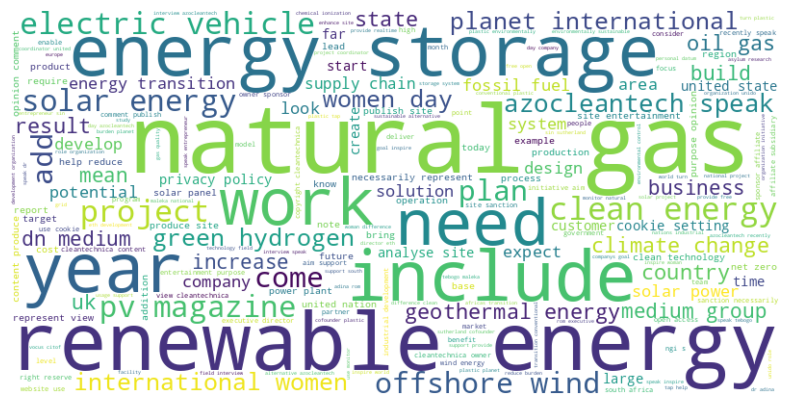

In [ ]:
# Join text for each doc
df['final_cleaned'] = df['stops_spacy'].apply(lambda x: ' '.join(x))

# Join all text
all_tokens_string = ' '.join(df['stops_spacy'].explode())

# Create wordcloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_tokens_string)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

From this wordcloud we can already see some potential topics. For example: natural gas, energy storage, offshore wind, electric vehicles, and solar energy. We can also see that the pre-processing has not cleaned out all redundant bits of information. For example "cookie setting" and "privacy policy" may need to be cleaned out of the corpus. This level of cleanliness may be enough to extract the main topics, however.

# Exploratory Analysis

First we can look at term frequencies. We can use nltk.probability.FreqDist to calculate the frequencies of terms in each document.

In [ ]:
# Calculate term frequencies for each record
df['term_frequencies'] = df['stops_spacy'].apply(lambda x:
                        nltk.probability.FreqDist(x))

df['term_frequencies'].head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0    {'qatar': 2, 'petroleum': 1, 'qp': 6, 'target': 3, 'aggressive': 1, 'cut': 1, 'greenhouse': 1, '...
1    {'nuclear': 4, 'power': 4, 'corp': 1, 'india': 1, 'ltd': 1, 'npcil': 4, 'synchronize': 1, 'kakra...
2    {'new': 1, 'president': 1, 'joe': 1, 'biden': 8, 'office': 1, 'week': 3, 'uschina': 2, 'relation...
3    {'slow': 1, 'pace': 1, 'japanese': 1, 'reactor': 8, 'restart': 8, 'continue': 1, 'cast': 1, 'dou...
4    {'new': 7, 'york': 7, 'city': 6, 'large': 1, 'pension': 4, 'fund': 6, 'divest': 1, 'roughly': 1,...
Name: term_frequencies, dtype: object

Then we can get the most frequent term for each document, and the number of documents that have the same most frequent word. The histogram below shows that a large number of documents have energy as the most frequent word, followed by solar, hydrogen, gas, and geothermal. We can surmise that these technologies will feature as topics in a large number of articles.

We also see that "s" is the most frequent term in a large number of documents. It may therefore be useful to go back and remove this in a further cleaning step.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



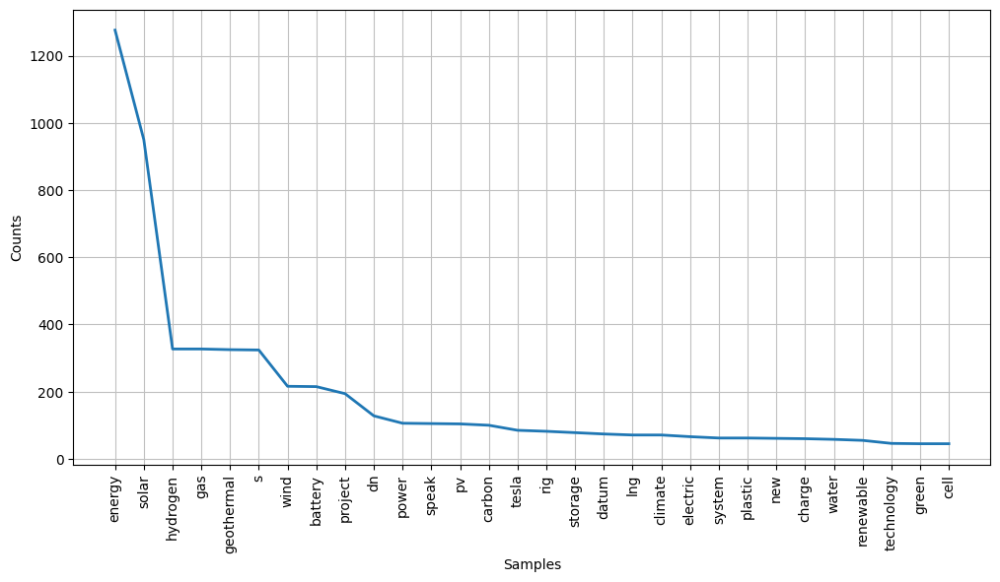

In [ ]:
# Aggregate most frequent words across all documents
freq_words = [max(term, key=term.get) for term in df['term_frequencies']]
corpus_freq_dist = nltk.probability.FreqDist(freq_words)

# Plot histogram
plt.figure(figsize=(12, 6))
corpus_freq_dist.plot(30, cumulative=False)
plt.show()

In [ ]:
freq_words[:10]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



['million',
 'project',
 'china',
 'reactor',
 'new',
 'court',
 'energy',
 'china',
 'water',
 'power']

We can also take a closer look at the word frequencies by each "domain". First we can see how many articles come from each domain.

In [ ]:
df['domain'].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



domain
cleantechnica            1861
azocleantech             1627
pv-magazine              1215
energyvoice              1020
solarindustrymag          673
naturalgasintel           659
thinkgeoenergy            646
rechargenews              559
solarpowerworldonline     505
energyintel               234
pv-tech                   232
businessgreen             158
greenprophet               80
ecofriend                  38
solarpowerportal.co        34
eurosolar                  28
decarbxpo                  19
solarquarter               17
indorenergy                 2
Name: count, dtype: int64

Next we can compare the first document from each of the top 3 domains.

In [ ]:
# Compare three domains
cleantechnica = df[df['domain'] == 'cleantechnica']['final_cleaned']
azocleantech = df[df['domain'] == 'azocleantech']['final_cleaned']
pv_magazine = df[df['domain'] == 'pv-magazine']['final_cleaned']
print(f"pv_magazine: {pv_magazine[:1]}\nazocleantech: {azocleantech[:1]}\ncleantechnica: {cleantechnica[:1]}")

pv_magazine: 6948    pv magazine webinar discuss paul wormser cea elias hinckley k l gate irs safe harbor provision s...
Name: final_cleaned, dtype: object
azocleantech: 2629    click allow agree storing cookie device enhance site navigation analyse site usage support provi...
Name: final_cleaned, dtype: object
cleantechnica: 1284    installment threepart series community solar low moderateincome costumer piece focus partnership...
Name: final_cleaned, dtype: object


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



This is not too illuminating so we will instead go on to create a word cloud from all the documents in each of the top 3 domains.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:


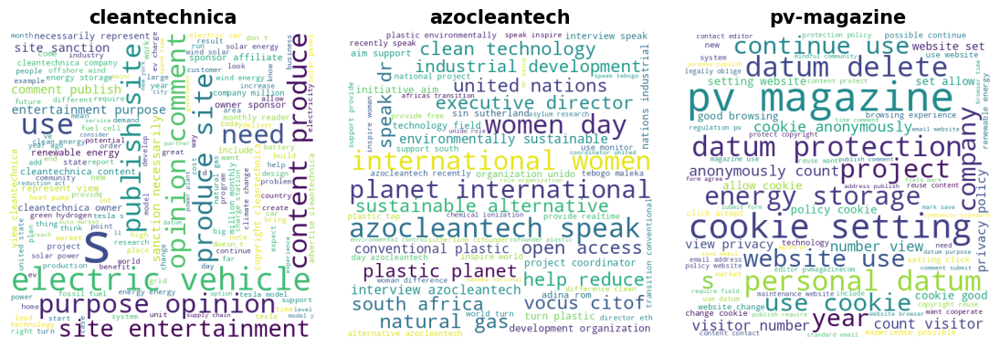

In [ ]:
rows=1
cols=3

row=0
col=0
titles = ['cleantechnica', 'azocleantech', 'pv-magazine']
w = [cleantechnica.str.cat(),azocleantech.str.cat(),pv_magazine.str.cat(),]
fig, ax = plt.subplots(1, 3, figsize=(12.5,6.5))

for i in range(3):
  ax[col].imshow(WordCloud(width = 500, height = 500,
                background_color ='white',
                min_font_size = 10).generate(w[i]))
  ax[col].axis("off")
  ax[col].set_title(titles[i], fontdict={'fontsize': 15, 'fontweight' : 'bold'})
  row=row+1
  if row==rows:
     row=0
     col=col+1

plt.subplots_adjust(left=0.07, right=0.93, wspace=0.1, hspace=0.0,top=0.94,bottom=0.09)
plt.show()

We can extrapolate from these word clouds that cleantechnica has many articles about electric vehicles. While azocleantech mentions international women's day and plastic many times. PV-magazine clearly has a data protection pop-up on its website because the most common words are about data and cookies. It may be helpful to expand our stop-word list to help filter out these words in another processing step.

We can also see that energy storage is a frequent word in PV-magazine.


With the new information we have we can expand the stop words list and go through the previous steps to generate new word clouds.

In [ ]:
stop_words_spacy = set(stop_words_spacy)
additional_stop_words = ["s", "cookie", "setting", "datum", "website", "azocleantech", "content", "cleantechnica"]

stop_words_spacy.update(additional_stop_words)

def stop_removal(df):
    stops_spacy = df['spacy_lemma'].apply(lambda x: [word for word in x if word.lower() not in stop_words_spacy])

    df['stops_spacy'] = stops_spacy

    df['final_cleaned'] = df['stops_spacy'].apply(lambda x: ' '.join(x))

    return df

df = stop_removal(df)

all_tokens_string = ' '.join(df['stops_spacy'].explode())

cleantechnica = df[df['domain'] == 'cleantechnica']['final_cleaned']
azocleantech = df[df['domain'] == 'azocleantech']['final_cleaned']
pv_magazine = df[df['domain'] == 'pv-magazine']['final_cleaned']

rows=1
cols=3

row=0
col=0
titles = ['cleantechnica', 'azocleantech', 'pv-magazine']
w = [cleantechnica.str.cat(),azocleantech.str.cat(),pv_magazine.str.cat(),]
fig, ax = plt.subplots(1, 3, figsize=(12.5,6.5))

for i in range(3):
  ax[col].imshow(WordCloud(width = 500, height = 500,
                background_color ='white',
                min_font_size = 10).generate(w[i]))
  ax[col].axis("off")
  ax[col].set_title(titles[i], fontdict={'fontsize': 15, 'fontweight' : 'bold'})
  row=row+1
  if row==rows:
     row=0
     col=col+1

plt.subplots_adjust(left=0.07, right=0.93, wspace=0.1, hspace=0.0,top=0.94,bottom=0.09)
plt.show()


## Type Token Ratio

As part of the exploratory data analysis, we can calculate the Type Token Ratio for each document. To do so we create a function that divides the number of unique tokens by the total number of tokens.

In [ ]:
# Calculate TTR
def calculate_ttr(tokens):
    unique_tokens = set(tokens)
    ttr = len(unique_tokens) / len(tokens)

    return ttr

df['ttr'] = df['lemmatized_content'].apply(calculate_ttr)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
print(df[['ttr']])

           ttr
0     0.460241
1     0.536680
2     0.459499
3     0.466165
4     0.505208
...        ...
9602  0.608844
9603  0.586207
9604  0.527859
9605  0.342840
9606  0.578171

[9607 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



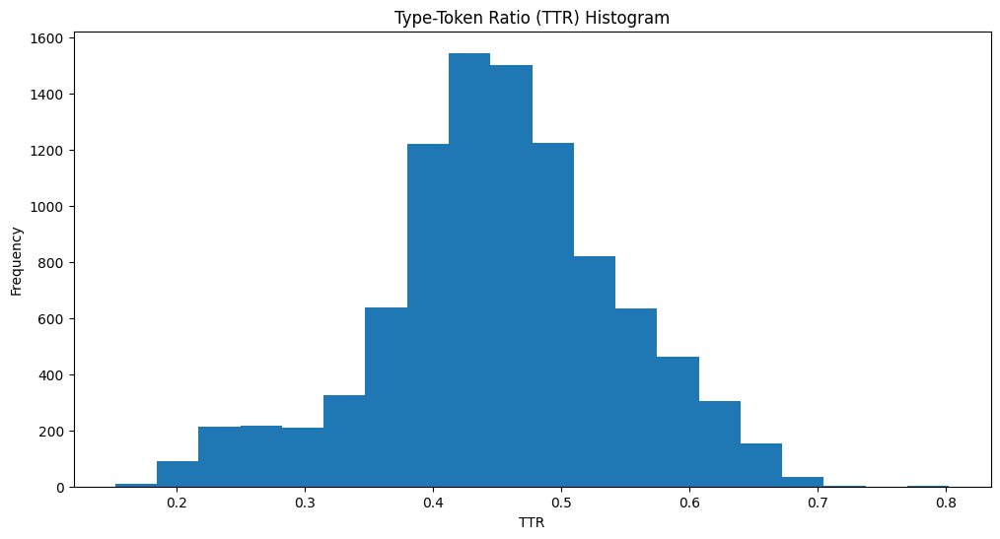

In [ ]:
plt.figure(figsize=(12, 6))
plt.hist(df['ttr'], bins=20)  # You can adjust the number of bins as needed
plt.title('Type-Token Ratio (TTR) Histogram')
plt.xlabel('TTR')
plt.ylabel('Frequency')
plt.show()

Most documents have a TTR around 0.4-0.5, which is not very high nor very low. There is another smaller group of documents that have a much higher lexical diversity at around 0.3 TTR. These documents may be harder to extract topics from, as the lexical diversity could hint at the fact that they cover multiple topics.

In [ ]:
# Add 'content length'
#df['content Length'] = df['content'].astype(str).apply(len)

# We already have content length, it is the word count column

df['num_tokens'] = df['lemmatized_content'].apply(lambda x: len(x))

# Add polarity
df['polarity'] = df['content_cleaned'].map(lambda text: TextBlob(str(text)).sentiment.polarity)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Descriptive statistics of your dataframe
df.describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,word_count,ttr,num_tokens,polarity
count,9607.000000,9607.000000,9607.000000,9607.000000
mean,748.198917,0.452457,748.407828,0.124910
std,440.948981,0.093266,441.157498,0.061657
min,187.000000,0.152174,187.000000,-0.247789
25%,416.500000,0.400957,417.000000,0.084332
50%,636.000000,0.451258,637.000000,0.120542
75%,962.000000,0.509927,962.000000,0.161656
max,2963.000000,0.802239,2963.000000,0.466667


In [ ]:
# Take a look at our new features
df.iloc[0][['num_tokens', 'polarity']]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



num_tokens         415
polarity      0.067613
Name: 0, dtype: object

We also applied a simple sentiment analysis to the articles to roughly determine whether they are mainly positive or negative. The plot below shows the distribution of sentiment polarity. A positive number indicates a mainly positive sentiment, while a negative number indicates a more negative sentiment.

Sentiment analysis gives us more information about the overall tone of the articles in the corpus. Positive sentiments may indicate optimism, support, and confidence, while negative sentiments could point to concerns or challenges.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Text(0.5, 1.0, 'Polarity distribution')

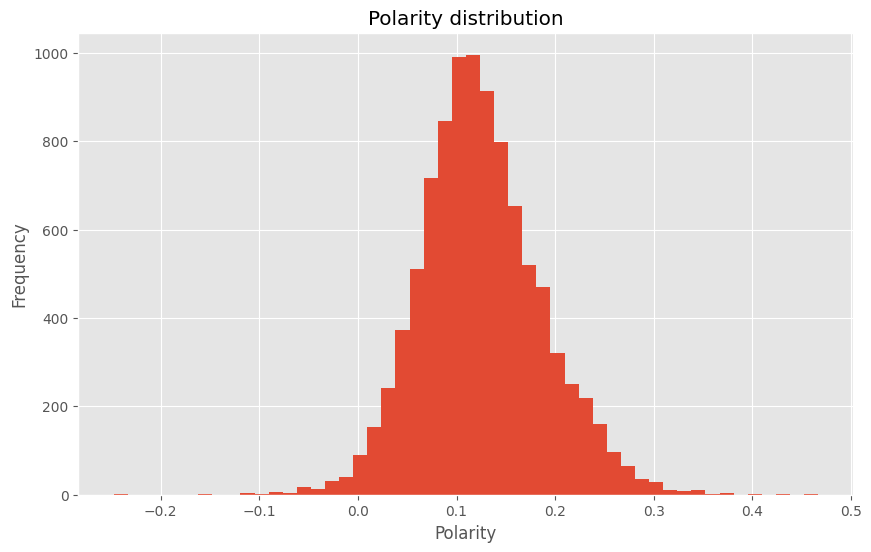

In [ ]:
# Plot the distribution of polarity sentiment score
# change plotting colors per client request
plt.style.use('ggplot')
df['polarity'].plot(kind='hist', bins=50)
plt.xlabel('Polarity')
plt.title('Polarity distribution')

We can see that in general the articles are fairly neutral, or slightly positive. This means in general the articles are written in a more objective tone. It is also reassuring to see that the articles are not mostly negative in tone.

To finish off the initial exploratory data analysis, below is a histogram containing the summary statistics for our dataset. To recap, it contains the Type-Token Ratio and Polarity distributions, as well as the word count and total token distributions.

We can see from these graphs that on average, articles in the corpus are around 500 words long. There are, however, also a number of articles over 1000 words in length. These longer articles may be harder to model as they may contain more topics and take longer to process.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



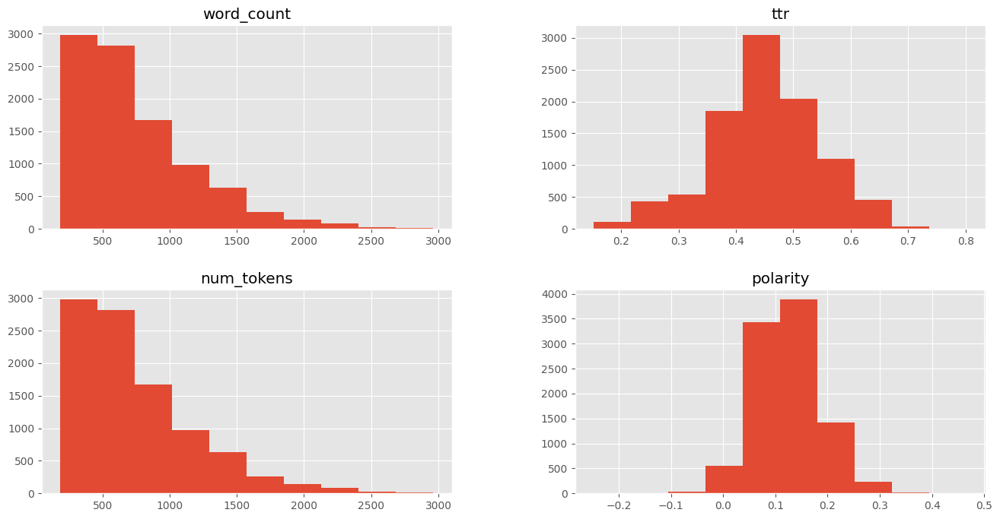

In [ ]:
df.hist(figsize=(16,8));

## Term Frequency-Inverse Document Frequency

To conduct a more thorough analysis of term frequencies. We conducted a term frequency-inverse document analysis.

This is a form of text vectorization that not only considers the frequency of a word in a document but also how important the word is in the entire corpus.

In [ ]:
# Remove more stop words just to be sure
# Grab standard English stopwords
stop_words = set(sklearn_stop_words.ENGLISH_STOP_WORDS)
# And add in some of our own ("like" is really common and doesn't tell us much)
stop_words = stop_words.union(set([
    "www", "http", "https", "br", "amazon", "href", "wa", "ha",
    "like", "just", "s", "cookie", "setting", "datum", "website", "azocleantech"
]))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Tokenize and turn into numbers
tfidf_vectorizer = TfidfVectorizer(
    max_df=0.9, # Remove any words that appear in more than 90% of our documents
    min_df=5, # Remove words that appear in fewer than 5 document
    ngram_range=(1, 1), # Only extract unigrams
    stop_words=list(stop_words), # Remove stopwords
    max_features=2500 # Grab the 2500 most common words (based on above constraints)
)
tfidf = tfidf_vectorizer.fit_transform(df['final_cleaned'])
ngrams = tfidf_vectorizer.get_feature_names_out()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
tfidf.todense()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



matrix([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.08605729, 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]])

In [ ]:
# Create a dataframe of unigrams
ngram_df = pd.DataFrame(tfidf.todense(), columns=ngrams)
ngram_df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,abandon,abb,aberdeen,ability,able,absorb,abundant,ac,academic,accelerate,accept,access,accessible,accord,account,...,yearyear,yes,yesterday,yield,york,young,youtube,yoy,zach,zackin,zealand,zero,zerocarbon,zeroemission,zone
0,0.000000,0.0,0.0,0.000000,0.042613,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
1,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.039201,0.0,...,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.086057,0.0,0.000000
2,0.000000,0.0,0.0,0.031868,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.088539,0.0,...,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.027411,0.000000,0.0,0.000000
3,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028781,0.0,...,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.054872
4,0.087962,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038063,0.0,...,0.0,0.0,0.0,0.0,0.46041,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



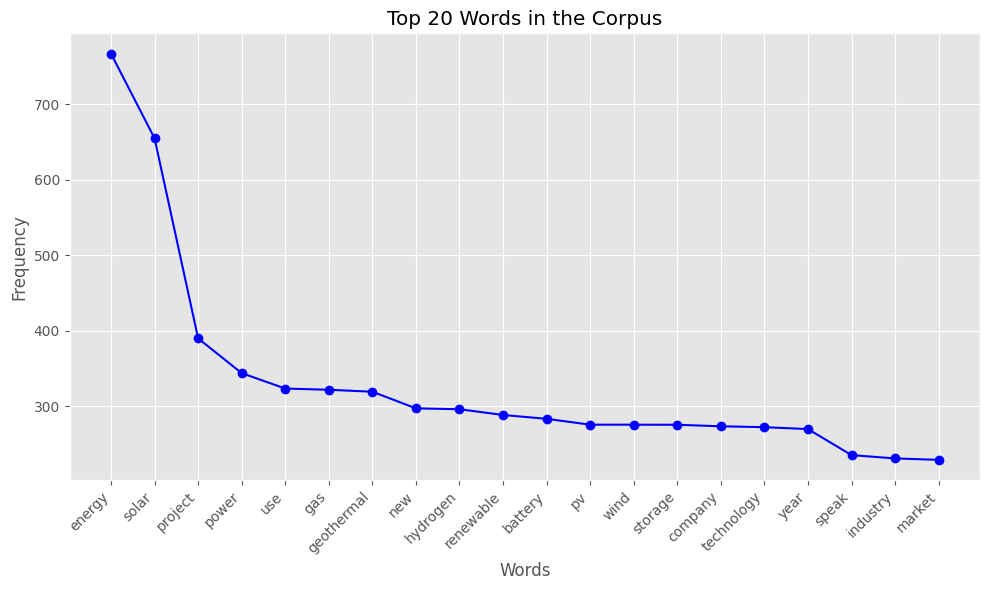

In [ ]:
# Identify the top 20 words in the corpus
top20_uni = ngram_df.sum().sort_values(ascending=False)[:20]

# Create a line graph
plt.figure(figsize=(10, 6))
plt.plot(top20_uni.index, top20_uni.values, marker='o', linestyle='-', color='b')
plt.title('Top 20 Words in the Corpus')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()

We can see that the top 20 words differs from the previous frequency calculation due to the added weighting of words. Regardless, energy and solar remain the top 2 words of the corpus. Now, lets do the same calculation for bigrams.

In [ ]:
# Tokenize and turn bigrams into numbers
tfidf_vectorizer2 = TfidfVectorizer(
    max_df=0.9, # Remove any words that appear in more than 90% of our documents
    min_df=5, # Remove words that appear in fewer than 5 document
    ngram_range=(2, 2), # Only extract unigrams
    stop_words=list(stop_words), # Remove stopwords
    max_features=2500 # Grab the 2500 most common words (based on above constraints)
)
tfidf2 = tfidf_vectorizer2.fit_transform(df['final_cleaned'])
ngrams2 = tfidf_vectorizer2.get_feature_names_out()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
tfidf2.todense()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
ngram2_df = pd.DataFrame(tfidf2.todense(), columns=ngrams2)
ngram2_df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,abigail ross,abu dhabi,accelerate deployment,accelerate development,accelerate energy,accelerate transition,accept consent,access ngi,access scientific,accord bkr,accord energy,accord international,accord late,accord new,accord plan,...,year year,yearago period,yearearli period,york city,york state,youtube advertise,zach longterm,zach recognize,zach tryin,zackin publications,zero carbon,zero emission,zero goal,zero target,zeroemission vehicle
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.574012,0.114006,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



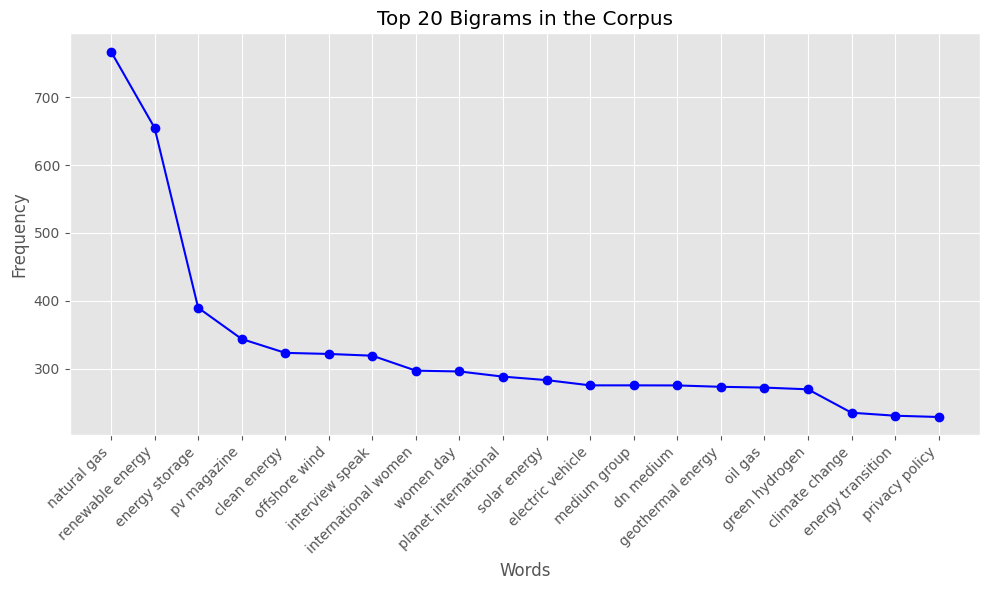

In [ ]:
top20_bi = ngram2_df.sum().sort_values(ascending=False)[:20]

# Create a line graph
plt.figure(figsize=(10, 6))
plt.plot(top20_bi.index, top20_uni.values, marker='o', linestyle='-', color='b')
plt.title('Top 20 Bigrams in the Corpus')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()

This gives us an even better idea of what the top topcis in clean-tech might be. So far there is strong indication that natural gas, energy (particularly solar and wind), and energy storage arre important topics in our corpus.

## Word2Vec

The next step in the exploratory analysis, utilises Word2Vec. This is primarily used for word embeddings, representing words as continuous vector spaces. It captures semantic relationships between words based on their context within a given corpus. We will use this to explore the semantic relationships between words.

In [ ]:
# Set values for various parameters
feature_size = 100  # Word vector dimensionality
window_context = 5  # Context window size
min_word_count = 5  # Minimum word count

w2vmodel = Word2Vec(sentences=df['lemmatized_content'], vector_size=feature_size, window=window_context, min_count=min_word_count, sg = 0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Inspect most similar words to, e.g., carbon, gas, energy, solar
w2vmodel.wv.most_similar('energy', topn=5)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[('electricity', 0.6275529861450195),
 ('power', 0.578736424446106),
 ('intermittent', 0.47816482186317444),
 ('hydropower', 0.40703755617141724),
 ('resource', 0.39581623673439026)]

Electricity and power show up as semantically similar words to energy. This makes sense but complement, intermittent and decentralized do not seem to be related. This could indicate the downfalls of a limited vocabulary in Word2vec. Lets analyze the similarity between two common words in the corpus.

In [ ]:
# Compute similarity between two words in the vocabulary by invoking the similarity() function and passing in the relevant words
w2vmodel.wv.similarity('energy', 'renewable')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0.20563842

The model could be improved based on the low similarity score between electricity and renewable. This was shown to be a very common bigram according to TF-IDF.

In [ ]:
# View similar words based on gensim's model
similar_words = {
    search_term:
    [item[0] for item in w2vmodel.wv.most_similar([search_term], topn=5)]
    for search_term in ['energy', 'fuel','gas', 'carbon', 'oil', 'wind']
}
similar_words

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



{'energy': ['electricity', 'power', 'intermittent', 'hydropower', 'resource'],
 'fuel': ['fuelpowere', 'fuelbase', 'fuelfired', 'fuelderive', 'fuelfire'],
 'gas': ['gasfired', 'nw', 'crude', 'horticulture', 'gasdirected'],
 'carbon': ['co', 'zincmanganese', 'ghg', 'ccus', 'methane'],
 'oil': ['silane', 'natural', 'fracking', 'russian', 'sour'],
 'wind': ['windfarm', 'aurelia', 'tidal', 'aquafarm', 'aquafarme']}

Fuel relates to all of its derivates such as fuel-based, fuel-powered, etc. While true, this does not reveal new and meaningful relationships in the corpus.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



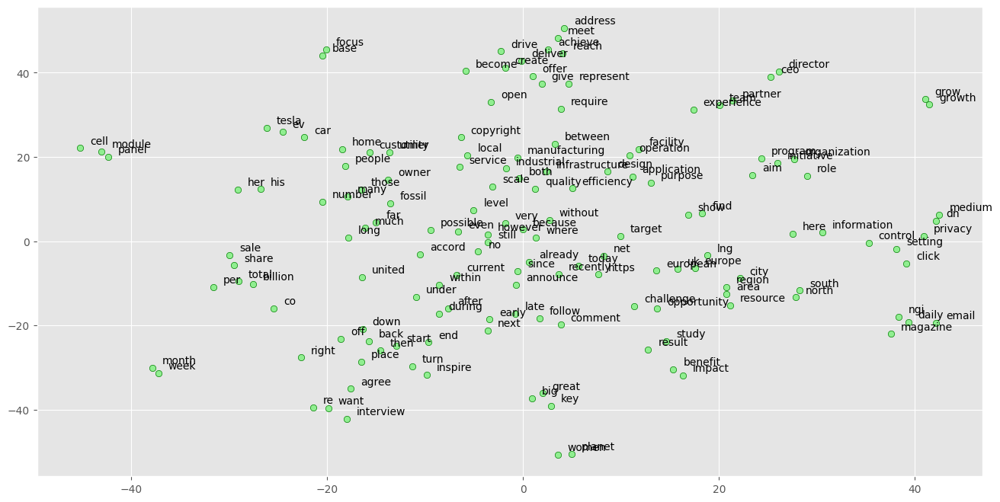

In [ ]:
# Plot a sample of vocublary showing semantic similarity

words = w2vmodel.wv.index_to_key[200:350]      ## get the word forms of voculary sample
wvs = w2vmodel.wv[words]                     ## get embeddings of word forms

tsne = TSNE(n_components=2, random_state=0, n_iter=5000, perplexity=5)
np.set_printoptions(suppress=True)
T = tsne.fit_transform(wvs)
labels = words

plt.figure(figsize=(16, 8))
plt.scatter(T[:, 0], T[:, 1], c='lightgreen', edgecolors='g')
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label,
                 xy=(x + 1, y + 1),
                 xytext=(0, 0),
                 textcoords='offset points')

This plot provides insight on the semantic similarity between words in the corpus. However, the table is very widely dispersed and could provide more insight if we focused on a single token. We will use the most freguently used token "energy" in the plot below.

In [ ]:
# Select topn similar words to a given token

def display_closestwords_tsnescatterplot(model, word, size):

    arr = np.empty((0,size), dtype='f')
    word_labels = [word]
    close_words = model.wv.similar_by_word(word, topn=75)
    arr = np.append(arr, np.array([model.wv[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = model.wv[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)

    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)
    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    plt.figure(figsize=(15, 8))
    plt.scatter(x_coords, y_coords)
    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
    plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
    plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



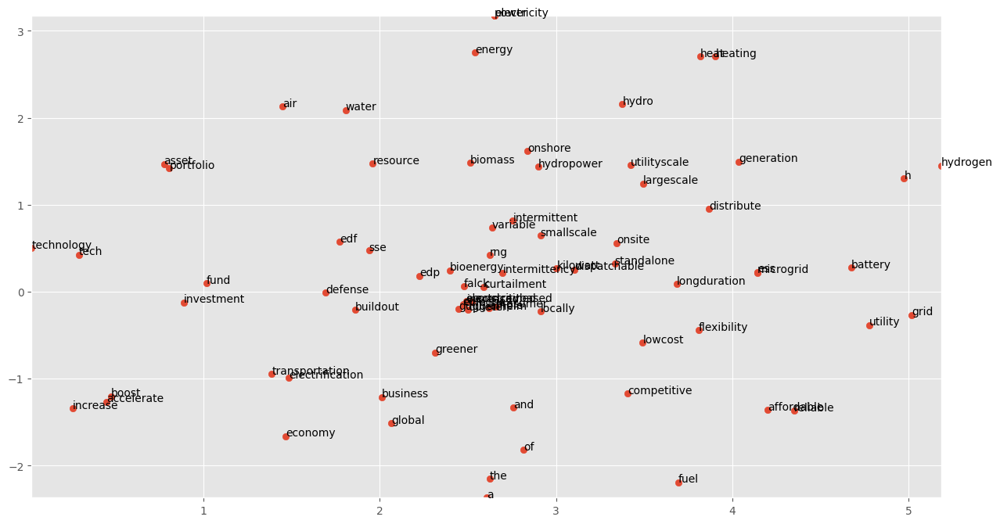

In [ ]:
# Inspect the most similar (play with topn if you like) and change the input token 'red' to other tokens
display_closestwords_tsnescatterplot(w2vmodel, 'energy',100)

The closest synonyms surround the term "energy" in the upper right section of the plot. Verbs applied to the term are located in the center middle and lower sections of the plot (i.e. decentralized, boosting, advancing, etc) while descriptive adjectives are on the right (i.e. lowcost, flexible, robust, etc). Nouns are more widely dispersed throughout the chart but higher concentrations can be seen on the edges of the plot (i.e. source, hydrogen, heat, elecricity, technology).

# Topic Modelling

Now we can move on to testing various topic modelling techniques. Although our exploratory analysis gave us some insight into what we can expect the article topics to be, topic modelling algorithms may uncover more topics or allow us to further distinguish subtopics within our corpus.

## LDA with Gensim

The Process

* We pick the number of topics ahead of time even if we’re not sure what the topics are.

* Each document is represented as a distribution over topics.

* Each topic is represented as a distribution over words.

First step is defining a function to prepare the text for topic modelling

In [ ]:
def prepare_text_for_lda(text):
    tokens = tokenize(text)
    tokens = [token for token in tokens if len(token) > 4]
    tokens = [token for token in tokens if token not in en_stop]
    tokens = [get_lemma(token) for token in tokens]
    return tokens

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



We are creating a dictionary from the data, then convert to bag-of-words corpus and save the dictionary and corpus for future use.


In [ ]:
text_data = df['stops_spacy']

dictionary = corpora.Dictionary(text_data)
corpus = [dictionary.doc2bow(text) for text in text_data]

pickle.dump(corpus, open('corpus.pkl', 'wb'))
dictionary.save('dictionary.gensim')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



We are asking LDA to find 10 topics in the data:

In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics = 10, id2word=dictionary, passes=15)
ldamodel.save('model10.gensim')
topics = ldamodel.print_topics(num_words=4)
for topic in topics:
    print(topic)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(0, '0.029*"gas" + 0.013*"energy" + 0.013*"natural" + 0.011*"price"')
(1, '0.011*"t" + 0.010*"cleantechnica" + 0.009*"company" + 0.008*"energy"')
(2, '0.023*"energy" + 0.017*"wind" + 0.016*"hydrogen" + 0.011*"green"')
(3, '0.018*"gas" + 0.015*"rig" + 0.015*"natural" + 0.014*"price"')
(4, '0.013*"climate" + 0.010*"change" + 0.009*"water" + 0.009*"use"')
(5, '0.017*"speak" + 0.016*"plastic" + 0.011*"development" + 0.010*"provide"')
(6, '0.045*"solar" + 0.037*"energy" + 0.018*"project" + 0.015*"power"')
(7, '0.017*"use" + 0.016*"system" + 0.012*"battery" + 0.011*"pv"')
(8, '0.061*"geothermal" + 0.041*"energy" + 0.016*"project" + 0.012*"development"')
(9, '0.028*"vehicle" + 0.026*"electric" + 0.020*"ev" + 0.017*"battery"')


For example topic 1 includes words like "solar", “energy”, “pv” and “power”. The sounds like a topic related to solar energy.

pyLDAvis is designed to help users interpret the topics in a topic model that has been fit to a corpus of text data. The package extracts information from a fitted LDA topic model to inform an interactive web-based visualization.

**Visualizing 10 Topics:**

In [ ]:
dictionary = gensim.corpora.Dictionary.load('dictionary.gensim')
corpus = pickle.load(open('corpus.pkl', 'rb'))
lda10 = gensim.models.ldamodel.LdaModel.load('model10.gensim')

lda_display10 = pyLDAvis.gensim.prepare(lda10, corpus, dictionary, sort_topics=False)
pyLDAvis.display(lda_display10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



We can see certain topics are clustered together, this indicates the similarity between topics. Saliency indicates the significance of a term in defining a topic. Relevance represents the likelihood of a word in a topic, adjusted by the topic's overall probability. Bubble size in the visualization reflects the relative importance of topics in the dataset. We can also look at individual topic and adjust the relevance metric. As a result we get a user-friendly visualisation. But since here we pick the number of topics ahead of time even if we’re not sure what the topics are, the best way to use LDA modelling technique is in combination with another one to visualize topics more concisely.

## Top2Vec Modelling

This model will use Doc2Vec and pre-trained models to create jointly embedded document and word vectors. The model does not require lemmatization or stop word removal and as a reult, we use the unprocessed content for the training.

In [ ]:
# Create a list of documents
documents = df["content"].tolist()
# Initialize Top2Vec model
model = Top2Vec(documents, speed="learn", workers=8)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

2023-11-29 14:49:50,308 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2023-11-29 14:50:08,983 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2023-11-29 14:50:22,158 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2023-11-29 14:55:36,773 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2023-11-29 14:56:08,846 - top2vec - INFO - Finding dense areas of documents
INFO:t

In [ ]:
# Save the model
model.save("top2vec_model_1")
model = Top2Vec.load("top2vec_model_1")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Get topics
topics = model.get_topics()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Get total number of topics discovered
model.get_num_topics()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



62

62 topics is too large to properly analyze. We can reduce the number of topics with topic reduction.

In [ ]:
model.hierarchical_topic_reduction(num_topics=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[[37, 52, 48, 55, 38, 34, 57, 23, 15, 12, 32, 41, 26, 17, 16],
 [19, 22, 39, 0],
 [27, 60, 11, 44, 28, 29, 45, 54, 4],
 [18, 8, 7, 33, 5],
 [53, 21, 14, 59, 42, 61, 20, 10],
 [40, 51, 56, 47, 49, 31, 35, 46, 9],
 [6, 43, 30, 24, 13],
 [58, 25, 36, 50, 3],
 [2],
 [1]]

Let's see how many documents are found in each topic.

In [ ]:
# This will return the number of documents most similar to each topic. Topics are in decreasing order of size.
topic_sizes, topic_nums = model.get_topic_sizes(reduced = True)
for topic_size, topic_num in zip(topic_sizes[::], topic_nums[::]):
    print(f"Topic Num {topic_num} has {topic_size} documents.")

Topic Num 0 has 1547 documents.
Topic Num 1 has 1323 documents.
Topic Num 2 has 1116 documents.
Topic Num 3 has 991 documents.
Topic Num 4 has 875 documents.
Topic Num 5 has 848 documents.
Topic Num 6 has 795 documents.
Topic Num 7 has 779 documents.
Topic Num 8 has 695 documents.
Topic Num 9 has 638 documents.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Now we will create a data frame to analyze the key words per topic.

In [ ]:
# # Creating a dataframe with topic numbers and topic words
# Get the topic numbers and words and scores for a specific topic
topic_sizes, topic_nums = model.get_topic_sizes(reduced = True)
topic_words, word_scores, topic_num = model.get_topics(len(topic_nums))

# Create an empty list to store the results
topics_data = []

# Iterate over topics
for i in range(len(topic_nums)):
    # Get words, word scores, and topic number for the current topic
    current_topic_words, current_word_scores, current_topic_num = model.get_topics()
    # Append the information for the current topic to the list
    # Words scores were excluded from the data frame because it did not add value to the analysis
    topics_data.append({'topic_nums': current_topic_num[i], 'topic_sizes': topic_sizes[i], 'topic_words': current_topic_words[i]})

# Create a DataFrame from the list of dictionaries
topics_df = pd.DataFrame(topics_data)

# Display the results DataFrame
topics_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,topic_nums,topic_sizes,topic_words
0,0,1547,"[solar, solarpower, solarapp, solarize, agrivoltaic, photovoltaic, solaredge, agrivoltaics, phot..."
1,1,1323,"[geothermal, geoenergy, hydrothermal, thinkgeoenergy, bioenergy, energies, energie, energy, geos..."
2,2,1116,"[environmentally, environmental, ecological, greenpeace, eco, environment, greentech, ozone, eco..."
3,3,991,"[solar, solarpower, agrivoltaic, agrivoltaics, solarapp, photovoltaic, solarize, terawatt, photo..."
4,4,875,"[solar, solarpower, agrivoltaic, solarapp, solarize, agrivoltaics, photovoltaic, photovoltaics, ..."
5,5,848,"[geoenergy, renewables, biofuels, biofuel, bioenergy, fuels, biogas, ecological, hydrocarbons, e..."
6,6,795,"[greenpeace, climatic, environmentally, ecological, environmental, climate, ecology, climates, e..."
7,7,779,"[environmentally, greenpeace, environmental, ecological, eco, biofuels, hydrogen, geoenergy, bio..."
8,8,695,"[geoenergy, renewables, energies, energie, thinkgeoenergy, bioenergy, solarpower, totalenergies,..."
9,9,638,"[geoenergy, renewables, bioenergy, energies, solarpower, thinkgeoenergy, energie, totalenergies,..."


It is clear from looking at the topic words that there are multiple topics with similar themes. We can try to further consildate the topics to better represent the corpus.

In [ ]:
model.hierarchical_topic_reduction(num_topics=8)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[[1, 19, 22, 39, 0],
 [37, 52, 48, 55, 38, 34, 57, 23, 15, 12, 32, 41, 26, 17, 16],
 [2, 6, 43, 30, 24, 13],
 [27, 60, 11, 44, 28, 29, 45, 54, 4],
 [18, 8, 7, 33, 5],
 [40, 51, 56, 47, 49, 31, 35, 46, 9],
 [53, 21, 14, 59, 42, 61, 20, 10],
 [58, 25, 36, 50, 3]]

In [ ]:
# This will return the number of documents most similar to each topic. Topics are in decreasing order of size.
topic_sizes, topic_nums = model.get_topic_sizes(reduced = True)
for topic_size, topic_num in zip(topic_sizes[::], topic_nums[::]):
    print(f"Topic Num {topic_num} has {topic_size} documents.")

Topic Num 0 has 1809 documents.
Topic Num 1 has 1531 documents.
Topic Num 2 has 1444 documents.
Topic Num 3 has 1289 documents.
Topic Num 4 has 973 documents.
Topic Num 5 has 901 documents.
Topic Num 6 has 882 documents.
Topic Num 7 has 778 documents.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# # Creating a dataframe with topic numbers and topic words
# Get the topic numbers and words and scores for a specific topic
topic_sizes, topic_nums = model.get_topic_sizes(reduced = True)
topic_words, word_scores, topic_num = model.get_topics(len(topic_nums))

# Create an empty list to store the results
topics_data = []

# Iterate over topics
for i in range(len(topic_nums)):
    # Get words, word scores, and topic number for the current topic
    current_topic_words, current_word_scores, current_topic_num = model.get_topics()
    # Append the information for the current topic to the list
    # Words scores were excluded from the data frame because it did not add value to the analysis
    topics_data.append({'topic_nums': current_topic_num[i], 'topic_sizes': topic_sizes[i], 'topic_words': current_topic_words[i]})

# Create a DataFrame from the list of dictionaries
topics_df = pd.DataFrame(topics_data)

# Display the results DataFrame
topics_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,topic_nums,topic_sizes,topic_words
0,0,1809,"[solar, solarpower, solarapp, solarize, agrivoltaic, photovoltaic, solaredge, agrivoltaics, phot..."
1,1,1531,"[geothermal, geoenergy, hydrothermal, thinkgeoenergy, bioenergy, energies, energie, energy, geos..."
2,2,1444,"[environmentally, environmental, ecological, greenpeace, eco, environment, greentech, ozone, eco..."
3,3,1289,"[solar, solarpower, agrivoltaic, agrivoltaics, solarapp, photovoltaic, solarize, terawatt, photo..."
4,4,973,"[solar, solarpower, agrivoltaic, solarapp, solarize, agrivoltaics, photovoltaic, photovoltaics, ..."
5,5,901,"[geoenergy, renewables, biofuels, biofuel, bioenergy, fuels, biogas, ecological, hydrocarbons, e..."
6,6,882,"[greenpeace, climatic, environmentally, ecological, environmental, climate, ecology, climates, e..."
7,7,778,"[environmentally, greenpeace, environmental, ecological, eco, biofuels, hydrogen, geoenergy, bio..."


The reduction helped consolidate the geoenergy topics. Nest, we will analyze word scores for the word "energy" to assess the quality of the model and compare to Word2Vec.

In [ ]:
# View similar words to compare to word2vec
words, word_scores = model.similar_words(keywords=["energy"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

energie 0.9679948652650594
energia 0.9679923917412034
energies 0.9578832351043322
invenergy 0.73162934761295
power 0.727291298882796
bioenergy 0.7196511327804295
electricity 0.7123777504653944
totalenergies 0.7088816732872208
geoenergy 0.7020878749553857
powering 0.6761471711208548
powered 0.6630630215890065
forces 0.6616799162905993
thinkgeoenergy 0.6562499327420745
powers 0.6530173301469431
electrification 0.6523933151872064
electrifying 0.647927059818536
force 0.64170559422348
synergy 0.6382513831310452
sunpower 0.6276562740020738
heat 0.6239166567141453


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



This model reveals that the documents contain many languages within the corpus and could be better represented with multi-lingual pre-trained embedder. Regardless, let's visualize the model to understand the quality.

In [ ]:
# # Creating another dataframe with documents assigned to the topics and document scores
# Get the topic sizes and topic numbers
topic_sizes, topic_nums = model.get_topic_sizes(reduced = True)

# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['topic', 'document_ids','document_scores'])

# Iterate over topics
for i in range(len(topic_sizes)):
    # Get documents, document scores, and document IDs for the current topic
    documents, document_scores, document_ids = model.search_documents_by_topic(reduced = True, topic_num=i, num_docs=topic_sizes[i])

    # Create a DataFrame for the current topic
    topic_df = pd.DataFrame({'topic': i, 'document_ids': document_ids, 'document_scores': document_scores})

    # Append the DataFrame for the current topic to the results DataFrame
    results_df = pd.concat([results_df, topic_df], ignore_index=True)

# Display the results DataFrame
results_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,topic,document_ids,document_scores
0,0,8986,0.874057
1,0,4749,0.871601
2,0,1150,0.865420
3,0,9597,0.861130
4,0,9018,0.858344
...,...,...,...
9602,7,8373,0.403469
9603,7,2617,0.337840
9604,7,2595,0.293619
9605,7,2544,0.275725


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0.74943703


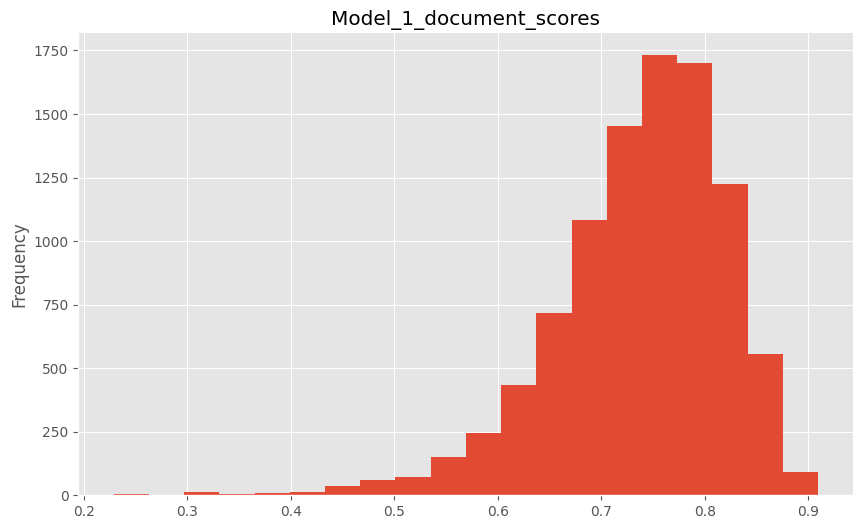

In [ ]:
results_df['document_scores'].plot(kind='hist', bins=20, title='Model_1_document_scores')
plt.gca().spines[['top', 'right',]].set_visible(False)
print(results_df['document_scores'].median())

The median document score is 0.74943703, which indicates a decent model. However, there are document scores are quite low for some of the documents. This could indicate that outliers exist in the data. Lets view the word clouds for each topic to get another view of the data.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:


<Figure size 200x200 with 0 Axes>

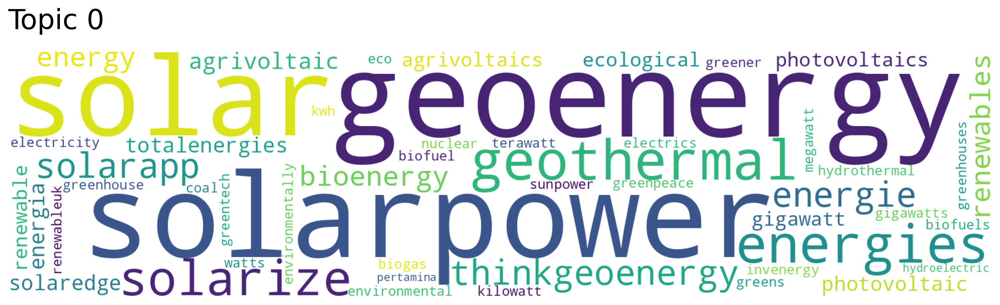

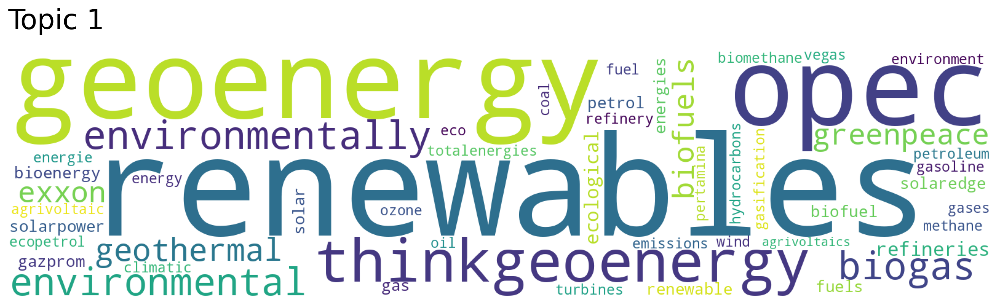

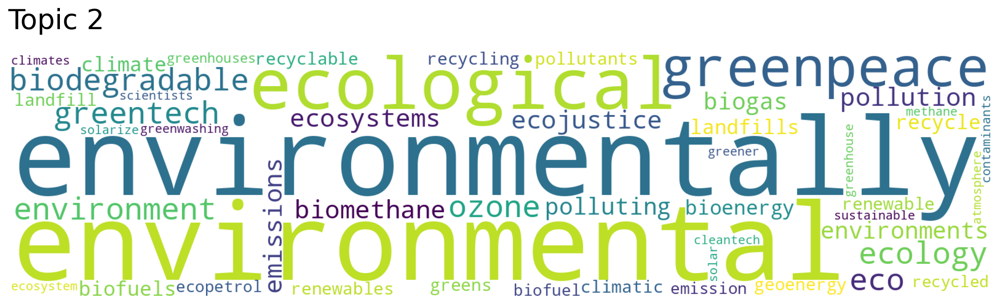

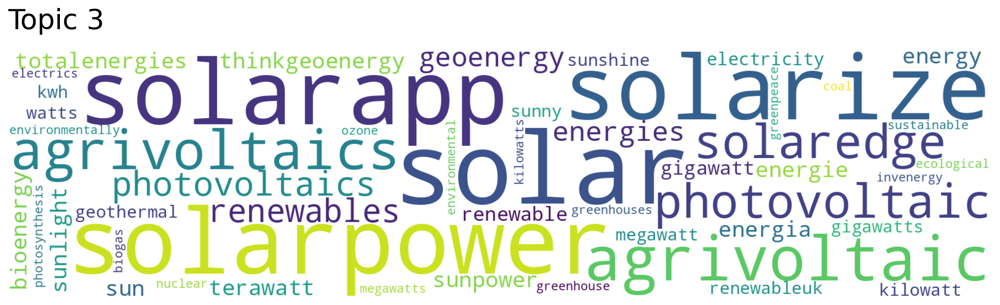

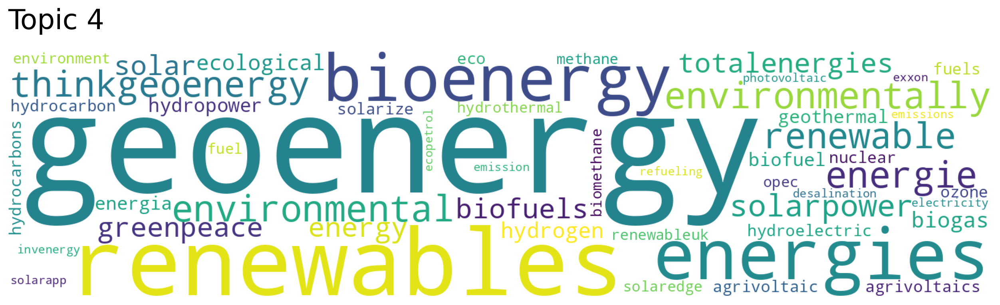

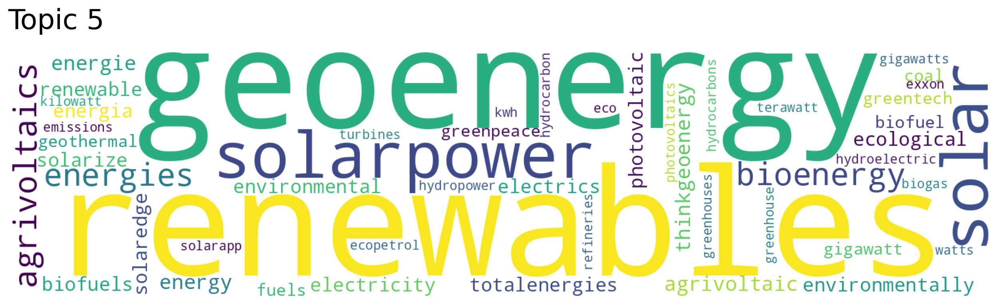

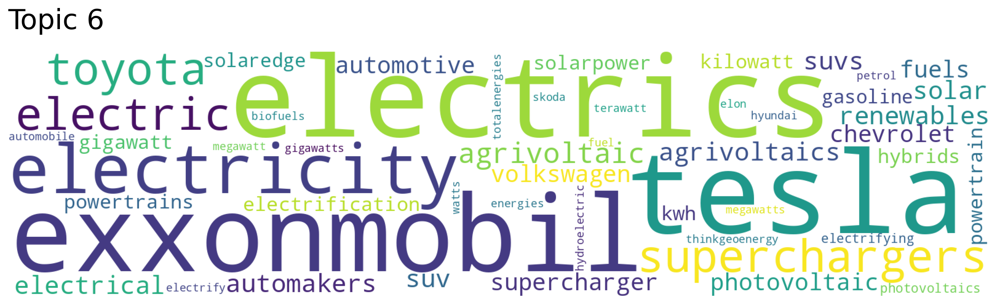

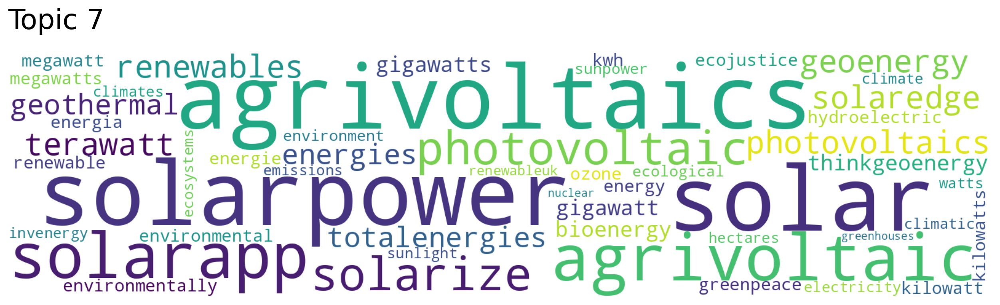

In [ ]:
plt.figure(figsize=(2, 2))
model.generate_topic_wordcloud(0, background_color='white', reduced=True)
model.generate_topic_wordcloud(1, background_color='white', reduced=True)
model.generate_topic_wordcloud(2, background_color='white', reduced=True)
model.generate_topic_wordcloud(3, background_color='white', reduced=True)
model.generate_topic_wordcloud(4, background_color='white', reduced=True)
model.generate_topic_wordcloud(5, background_color='white', reduced=True)
model.generate_topic_wordcloud(6, background_color='white', reduced=True)
model.generate_topic_wordcloud(7, background_color='white', reduced=True)
plt.axis('off')
plt.show()

This model is performing quite well in regards to the lack of stop words in the word clouds. Only meaningful words appear in the topics, but there are different variations of words in several languages.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



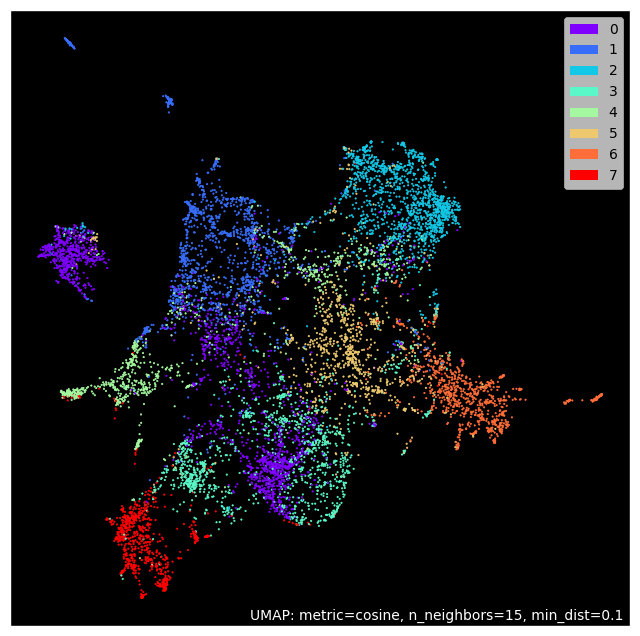

In [ ]:
# Visualizing clusters
umap_args = {'n_neighbors': 15,
             'n_components': 2,
             'metric': 'cosine'}

umap_model = umap.UMAP(**umap_args).fit(model.document_vectors)
umap_fig2 = umap.plot.points(umap_model, labels=model.doc_top_reduced, theme='fire')

The UMAP plot reveals clusters that are mostly distinguishable, but there are some areas with a strong overlap, such as topic 0 and topic 3. The HDBSCAN plot below indicates the areas of the plot that are the most dense.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/hdbscan/hdbscan_.py:1170: DeprecationWarning:

`alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.



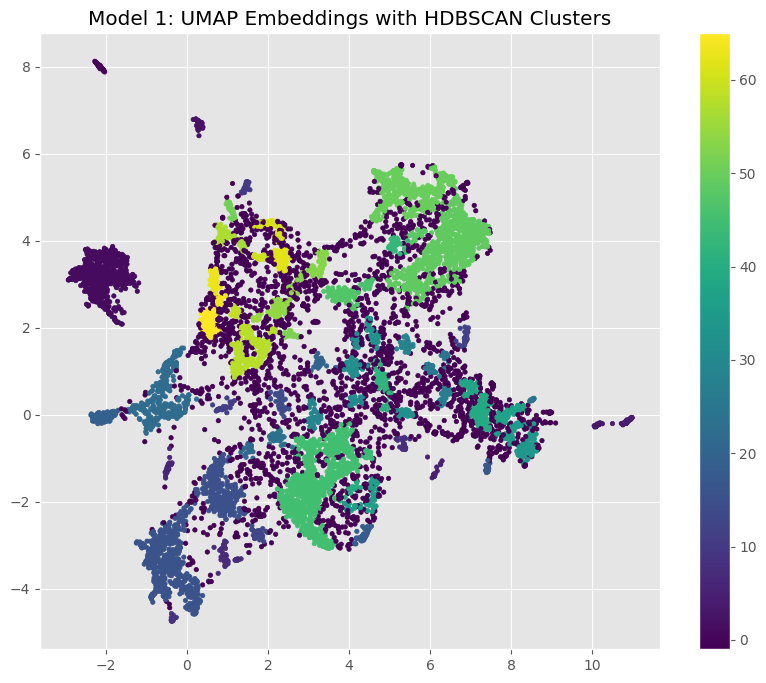

In [ ]:
# HDBSCAN
hdbscan_args = {'min_cluster_size': 15,
                'metric': 'euclidean',
                'cluster_selection_method': 'eom'}
cluster = hdbscan.HDBSCAN(**hdbscan_args).fit(umap_model.embedding_)

# Plot UMAP embeddings with HDBSCAN clusters
plt.figure(figsize=(10, 8))
plt.scatter(umap_model.embedding_[:, 0], umap_model.embedding_[:, 1], c=cluster.labels_, cmap='viridis', s=10)
plt.colorbar()
plt.title('Model 1: UMAP Embeddings with HDBSCAN Clusters')
plt.show()

Now lets try a different, pre-trained embedding model specifically for multi-ligual content to improve our model. We will follow the same steps as above.

In [ ]:
documents = df["content"].tolist()
model2 = Top2Vec(documents, embedding_model='universal-sentence-encoder-multilingual')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

2023-11-29 15:11:42,148 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2023-11-29 15:12:02,835 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2023-11-29 15:12:04,365 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2023-11-29 15:17:16,092 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2023-11-29 15:17:26,509 - top2vec - INFO - Finding dense areas of documents
INFO:t

In [ ]:
# Get topics
topics = model2.get_topics()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Get total number of topics discovered
model2.get_num_topics()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



66

In [ ]:
model2.hierarchical_topic_reduction(num_topics=8)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[[1, 19, 6, 27, 22, 37, 46, 45, 0],
 [33, 36, 57, 61, 25, 58, 60, 8, 18, 11, 54, 16, 21, 28, 42, 49, 31],
 [30, 65, 14, 34, 13, 44, 59, 4],
 [29, 40, 7, 32, 47, 35, 43, 55, 39, 41, 48, 52, 53, 10],
 [62, 24, 38, 51, 3],
 [26, 17, 63, 50, 64, 20, 56, 12],
 [9, 2],
 [23, 15, 5]]

In [ ]:
# This will return the number of documents most similar to each topic. Topics are in decreasing order of size.
topic_sizes, topic_nums = model2.get_topic_sizes(reduced=True)
for topic_size, topic_num in zip(topic_sizes[::], topic_nums[::]):
    print(f"Topic Num {topic_num} has {topic_size} documents.")

Topic Num 0 has 1912 documents.
Topic Num 1 has 1641 documents.
Topic Num 2 has 1358 documents.
Topic Num 3 has 1287 documents.
Topic Num 4 has 1013 documents.
Topic Num 5 has 869 documents.
Topic Num 6 has 767 documents.
Topic Num 7 has 760 documents.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# View similar words to compare to word2vec
words, word_scores = model2.similar_words(keywords=["energy"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

energie 0.9679948652650594
energia 0.9679923917412034
energies 0.9578832351043322
invenergy 0.73162934761295
power 0.727291298882796
bioenergy 0.7196511327804295
electricity 0.7123777504653944
totalenergies 0.7088816732872208
geoenergy 0.7020878749553857
powering 0.6761471711208548
powered 0.6630630215890065
forces 0.6616799162905993
thinkgeoenergy 0.6562499327420745
powers 0.6530173301469431
electrification 0.6523933151872064
electrifying 0.647927059818536
force 0.64170559422348
synergy 0.6382513831310452
sunpower 0.6276562740020738
heat 0.6239166567141453


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# # Creating a dataframe with topic numbers and topic words
# Get the topic numbers and words and scores for a specific topic
topic_sizes, topic_nums = model2.get_topic_sizes(reduced=True)
topic_words, word_scores, topic_num = model2.get_topics(len(topic_nums))

# Create an empty list to store the results
topics_data = []

# Iterate over topics
for i in range(len(topic_nums)):
    # Get words, word scores, and topic number for the current topic
    current_topic_words, current_word_scores, current_topic_num = model2.get_topics()
    # Append the information for the current topic to the list
    # Words scores were excluded from the data frame because it did not add value to the analysis
    topics_data.append({'topic_nums': current_topic_num[i], 'topic_sizes': topic_sizes[i], 'topic_words': current_topic_words[i]})

# Create a DataFrame from the list of dictionaries
topics_df = pd.DataFrame(topics_data)

# Display the results DataFrame
topics_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,topic_nums,topic_sizes,topic_words
0,0,1912,"[solar, solarpower, solarapp, solarize, agrivoltaic, photovoltaic, solaredge, agrivoltaics, geoe..."
1,1,1641,"[geothermal, geoenergy, hydrothermal, thinkgeoenergy, bioenergy, energies, energie, energy, geos..."
2,2,1358,"[environmentally, environmental, ecological, greenpeace, eco, environment, ozone, greentech, eco..."
3,3,1287,"[solar, solarpower, agrivoltaic, agrivoltaics, solarapp, photovoltaic, solarize, terawatt, geoen..."
4,4,1013,"[solar, solarpower, agrivoltaic, solarapp, solarize, agrivoltaics, photovoltaic, photovoltaics, ..."
5,5,869,"[climatic, greenpeace, environmentally, ecological, environmental, climate, ecology, climates, e..."
6,6,767,"[geoenergy, renewables, energies, energie, thinkgeoenergy, solarpower, bioenergy, totalenergies,..."
7,7,760,"[hydrogen, renewables, hydropower, geoenergy, hydrocarbon, hydrocarbons, biofuels, hydroelectric..."


In [ ]:
# # Creating another dataframe with documents assigned to the topics and document scores
# Get the topic sizes and topic numbers
topic_sizes, topic_nums = model2.get_topic_sizes(reduced = True)

# Create an empty DataFrame to store the results
results_df2 = pd.DataFrame(columns=['topic', 'document_ids','document_scores'])

# Iterate over topics
for i in range(len(topic_sizes)):
    # Get documents, document scores, and document IDs for the current topic
    documents, document_scores, document_ids = model2.search_documents_by_topic(reduced = True, topic_num=i, num_docs=topic_sizes[i])

    # Create a DataFrame for the current topic
    topic_df = pd.DataFrame({'topic': i, 'document_ids': document_ids, 'document_scores': document_scores})

    # Append the DataFrame for the current topic to the results DataFrame
    results_df2 = pd.concat([results_df2, topic_df], ignore_index=True)

# Display the results DataFrame
results_df2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,topic,document_ids,document_scores
0,0,4749,0.868694
1,0,1150,0.866588
2,0,8986,0.866401
3,0,9256,0.855866
4,0,9597,0.855638
...,...,...,...
9602,7,2563,0.334958
9603,7,2588,0.332429
9604,7,2521,0.329245
9605,7,2547,0.250333


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0.7488154


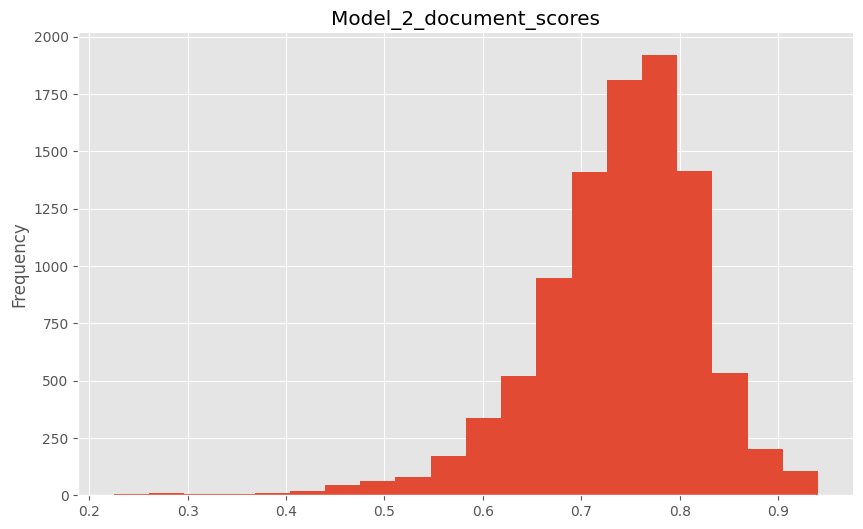

In [ ]:
results_df2['document_scores'].plot(kind='hist', bins=20, title='Model_2_document_scores')
plt.gca().spines[['top', 'right',]].set_visible(False)
print(results_df2['document_scores'].median())

Even with the new model, the median documents scores are about the same as the Doc2Vec model.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



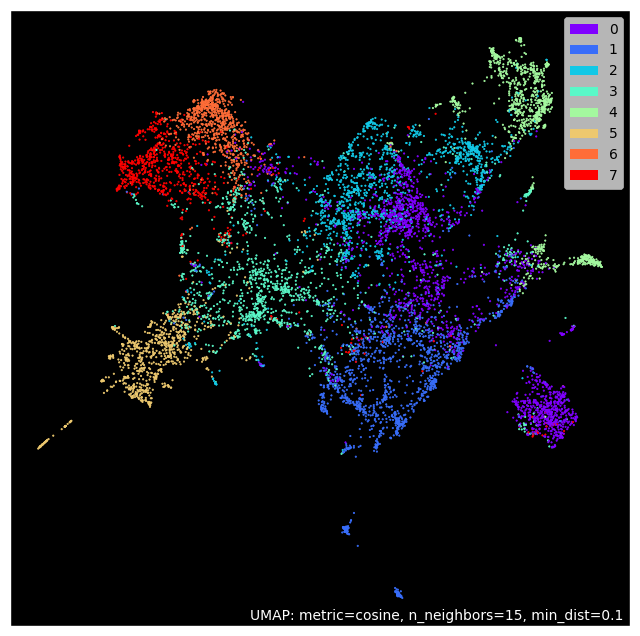

In [ ]:
umap_model2 = umap.UMAP(**umap_args).fit(model2.document_vectors)
umap_fig22 = umap.plot.points(umap_model2, labels=model2.doc_top_reduced, theme='fire')

The data appears to have slightly better distinction between the topics with less overlap. Topic 7 appears to have a few outliers in different topic areas. Similarly, the HDBSCAN plot below reveals the areas of the heaviest density, thus revealing the areas to prioritize in the corpus.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/hdbscan/hdbscan_.py:1170: DeprecationWarning:

`alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.



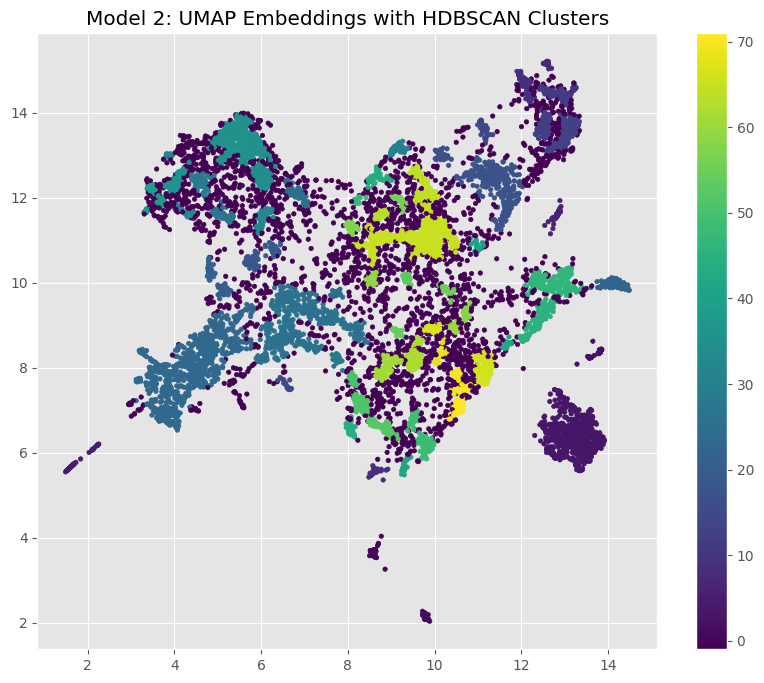

In [ ]:
# HDBSCAN
hdbscan_args = {'min_cluster_size': 15,
                'metric': 'euclidean',
                'cluster_selection_method': 'eom'}
cluster = hdbscan.HDBSCAN(**hdbscan_args).fit(umap_model2.embedding_)

# Plot UMAP embeddings with HDBSCAN clusters
plt.figure(figsize=(10, 8))
plt.scatter(umap_model2.embedding_[:, 0], umap_model2.embedding_[:, 1], c=cluster.labels_, cmap='viridis', s=10)
plt.colorbar()
plt.title('Model 2: UMAP Embeddings with HDBSCAN Clusters')
plt.show()

## BERTopic Modelling

Finally we will test how a BERTopic model performs on our data. BERTopic is trained on normal un-processed text. Because of this it is not recommended to used tokenized or lemmatised text to train a BERTopic model. So we will instead use the unprocessed content of each article.

In [ ]:
contents = df["content"]
titles = df["title"]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



For BERTopic modelling we first pre-calculate the embeddings for our documents so that we don't need to re-calculate them each time we want to run the model. This makes it easier if we want to adjust parameters later on. Our articles are on average about 500 words long, which means that the sentence transformer embedder should work well on most of them to calculate the embeddings. However some articles are on the longer side and may contain multiple paragraphs. If the topic modelling is not very succesful we could consider breaking these documents up into paragaphs or sentences before calculating the embeddings.

In [ ]:
# Pre-calculate embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(contents, show_progress_bar=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



.gitattributes:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

data_config.json:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

train_script.py:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

Batches:   0%|          | 0/301 [00:00<?, ?it/s]

The next step creates the models to be used in the BERTopic pipeline.

*   UMAP: An algorithm to reduce dimensionality. We set the initial parameters to:

> * n_neighbors = 15
> * n_components = 5
> * min_dist=0.0

*   HDBSCAN: Clustering algorithm. Here we set the min_cluster_size. The number 35 was arrived at after testing first 50 (produced too few topics) and 40 (produced too few topics).

> * min_cluster_size = 35

*   Vectorizer: Improves representations by removing stop words and ignoring infrequent words.

> * ngram_range = (1,2) This will allow two word pairs such as "solar power".

The following models were used to gain different representations of topics, as part of a multi-aspect topic modelling procedure. These may give different perspectives/further insights into topics:

*   KeyBERTInspired
*   PartOfSpeech
*   MaximalMarginalRelevance

In [ ]:
#Umap model - dimensionality reduction
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

#hdbscan model - clustering algorithm
hdbscan_model = HDBSCAN(min_cluster_size=35, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

#vectorizer model
vectorizer_model = CountVectorizer(stop_words="english", min_df=2, ngram_range=(1, 2))

# KeyBERT
keybert_model = KeyBERTInspired()

# Part-of-Speech
pos_model = PartOfSpeech("en_core_web_sm")

# MMR
mmr_model = MaximalMarginalRelevance(diversity=0.3)

# All representation models
representation_model = {
    "KeyBERT": keybert_model,
    "MMR": mmr_model,
    "POS": pos_model
}
topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

topics, probs = topic_model.fit_transform(contents, embeddings)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

2023-11-29 15:24:09,430 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2023-11-29 15:24:27,874 - BERTopic - Dimensionality - Completed ✓
2023-11-29 15:24:27,876 - BERTopic - Cluster - Start clustering the reduced embeddings
/usr/local/lib/python3.10/dist-packages/hdbscan/hdbscan_.py:1170: DeprecationWarning:

`alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.

2023-11-29 15:24:28,264 - BERTopic - Cluster - Completed ✓
2023-11-29 15:24:28,270 - BERTopic - Representation - Extracting topics from clusters using representation models.
2023-11-29 15:25:27,853 - BERTopic - Representation 

In [ ]:
topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

topics, probs = topic_model.fit_transform(contents, embeddings)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

2023-11-29 15:25:33,421 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2023-11-29 15:25:54,188 - BERTopic - Dimensionality - Completed ✓
2023-11-29 15:25:54,190 - BERTopic - Cluster - Start clustering the reduced embeddings
/usr/local/lib/python3.10/dist-packages/hdbscan/hdbscan_.py:1170: DeprecationWarning:

`alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.

2023-11-29 15:25:54,584 - BERTopic - Cluster - Completed ✓
2023-11-29 15:25:54,589 - BERTopic - Representation - Extracting topics from clusters using representation models.
2023-11-29 15:26:50,974 - BERTopic - Representation 

In [ ]:
topic_model.get_topic_info()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Topic,Count,Name,Representation,KeyBERT,MMR,POS,Representative_Docs
0,-1,3697,-1_energy_solar_power_new,"[energy, solar, power, new, storage, pv, wind, said, data, renewable]","[renewable energy, solar energy, renewable, energy storage, solar, clean energy, sustainable, en...","[energy, solar, power, new, storage, pv, wind, said, data, renewable]","[energy, solar, power, new, storage, pv, wind, data, renewable, technology]",[['There are three main drivers behind the continuing growth of solar today: the economics of en...
1,0,685,0_geothermal_geothermal energy_energy_heat,"[geothermal, geothermal energy, energy, heat, project, drilling, heating, development, power, ge...","[geothermal energy, geothermal power, geothermal development, geothermal resources, geothermal, ...","[geothermal, geothermal energy, energy, heat, project, drilling, heating, development, power, ge...","[geothermal, geothermal energy, energy, heat, project, drilling, heating, development, power, ge...",[['IRENA hosted a discussion on the status of the global geothermal market and technology as par...
2,1,452,1_solar_energy_project_community,"[solar, energy, project, community, projects, community solar, power, renewable, storage, mw]","[solar projects, solar energy, solar project, community solar, solar industry, solar power, sola...","[solar, energy, project, community, projects, community solar, power, renewable, storage, mw]","[solar, energy, project, community, projects, power, renewable, storage, renewable energy, solar...","[['SolRiver Capital, a renewable energy investment firm, has unveiled plans for the Canyonville ..."
3,2,425,2_hydrogen_green_green hydrogen_fuel,"[hydrogen, green, green hydrogen, fuel, energy, gas, production, ammonia, carbon, azocleantech]","[green hydrogen, hydrogen fuel, hydrogen production, hydrogen, blue hydrogen, renewable energy, ...","[hydrogen, green, green hydrogen, fuel, energy, gas, production, ammonia, carbon, azocleantech]","[hydrogen, green, green hydrogen, fuel, energy, gas, production, ammonia, carbon, use]","[[""By clicking `` Allow All '' you agree to the storing of cookies on your device to enhance sit..."
4,3,389,3_gas_natural gas_lng_natural,"[gas, natural gas, lng, natural, said, ngi, daily, oil, news, year]","[natural gas, naturalgasintel com, oil gas, gas news, naturalgasintel, gas intelligence, ngi new...","[gas, natural gas, lng, natural, said, ngi, daily, oil, news, year]","[gas, natural gas, lng, natural, daily, oil, news, year, carbon, emissions]",[['Sign in to get the best natural gas news and data. Follow the topics you want and receive the...
5,4,343,4_climate_azocleantech_change_research,"[climate, azocleantech, change, research, climate change, water, women, spoke, carbon, food]","[climate change, ecosystems, warming, climate, agriculture, environmental, sustainable, biodiver...","[climate, azocleantech, change, research, climate change, water, women, spoke, carbon, food]","[climate, change, research, water, women, carbon, food, study, planet, species]","[[""By clicking `` Allow All '' you agree to the storing of cookies on your device to enhance sit..."
6,5,335,5_azocleantech_women_spoke_plastic,"[azocleantech, women, spoke, plastic, interview, planet, international women, women day, planet ...","[azocleantech, azocleantech recently, interview azocleantech, day azocleantech, clean technology...","[azocleantech, women, spoke, plastic, interview, planet, international women, women day, planet ...","[women, plastic, interview, planet, organization, international, support, development, site, sus...","[[""By clicking `` Allow All '' you agree to the storing of cookies on your device to enhance sit..."
7,6,245,6_solar_manufacturing_pv_supply,"[solar, manufacturing, pv, supply, capacity, gw, energy, industry, module, domestic]","[solar manufacturing, solar industry, solar panels, solar energy, solar panel, solar, tariffs, m...","[solar, manufacturing, pv, supply, capacity, gw, energy, industry, modul

We can we that the model has generated 36 topic representations. The topic labelled -1 contains all the documents that could not be classified by the model. These are the outlier topics.

At first glance the topic model seems to have identified certain major topics correctly. For example, Topic 1 is solar_energy_project_community, which is certainly an important clean technology. There are some indications that the topic modelling could use some refinement as there are potentially a number of redundant topics. There are also a large number of outliers that would be good to classify.

We can first take a close look at a representative document from Topic 0, to see if the topic was correctly identified, which should contain articles about geothermal energy.

In [ ]:
representative_docs = topic_model.get_representative_docs(topic=0)
representative_docs[0][:500]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



"['IRENA hosted a discussion on the status of the global geothermal market and technology as part of the Council meeting with 16 countries in attendance.', 'During the 25th International Renewable Energy Agency ( IRENA) Council meeting held in Abu Dhabi, UAE on 23-24 May 2023, the Agency organised a dedicated Programmatic Discussion on the Global Status of Geothermal Market and Technology, to promote the role of geothermal in the energy transition. During the discussion, key findings of a recent "

The article is indeed about geothermal energy, so it appears BERTopic was successful in modelling the topic of this article.

Below we can see the all the representations from the different models for this topic.

In [ ]:
topic_model.get_topic(0, full=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



{'Main': [('geothermal', 0.0743902280208743),
  ('geothermal energy', 0.02730387750129221),
  ('energy', 0.024643045939824887),
  ('heat', 0.014599240237984602),
  ('project', 0.01345563943712915),
  ('drilling', 0.01287604576194148),
  ('heating', 0.012666282484338761),
  ('development', 0.012321112933949545),
  ('power', 0.011583494535506843),
  ('geothermal power', 0.009609615673269742)],
 'KeyBERT': [('geothermal energy', 0.816259),
  ('geothermal power', 0.7901813),
  ('geothermal development', 0.7692965),
  ('geothermal resources', 0.7681289),
  ('geothermal', 0.75884235),
  ('geothermal projects', 0.7540848),
  ('geothermal heating', 0.750604),
  ('geothermal project', 0.73611724),
  ('geothermal systems', 0.7162014),
  ('deep geothermal', 0.6291959)],
 'MMR': [('geothermal', 0.0743902280208743),
  ('geothermal energy', 0.02730387750129221),
  ('energy', 0.024643045939824887),
  ('heat', 0.014599240237984602),
  ('project', 0.01345563943712915),
  ('drilling', 0.0128760457619414

In [ ]:
# change topic label
keybert_topic_labels = {topic: " | ".join(list(zip(*values))[0][:3]) for topic, values in topic_model.topic_aspects_["KeyBERT"].items()}
topic_model.set_topic_labels(keybert_topic_labels)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



We can now take a look at the approximated topic distributions of a specific article to better analyse our model's performance.

In [ ]:
topic_distr, _ = topic_model.approximate_distribution(contents, window=8, stride=4)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

100%|██████████| 10/10 [00:33<00:00,  3.37s/it]


In [ ]:
content_id = 900
print(contents[content_id])

['Equinor has approved a final investment decision ( FID) on the Blandford Road battery storage project in the UK, the first of several UK developments said to be on the cards.', 'The scheme will be built under a strategic partnership between Equinor and Noriker Power, a flexible power developer in which the company made an equity investment last year.', 'In addition to its 45% equity share of the company, Equinor agreed a strategic cooperation framework with Noriker which grants it the opportunity to directly participate in projects the company develops.', 'It has already built over 250MW of large-scale battery and hybrid facilities, though the Blandford Road scheme is the first project from its pipeline that Equinor has matured to an investment decision.', 'The 25MW / 50 MWh battery storage plant will be built in Dorset, England. The project will use CATL lithium-ion battery racks and connect to SSE’ s distribution network, providing capability to manage power intermittency, balance 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
topic_model.visualize_distribution(topic_distr[content_id], custom_labels=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



The model seems to successfully identify that the main topics of the article are energy storage and battery technology.

Our topic model generated a large number of outliers. We will run an outlier reduction technique to try and assign these articles to topics.

In [ ]:
# Reduce outliers with pre-calculate embeddings instead
new_topics = topic_model.reduce_outliers(contents, topics, strategy="embeddings", embeddings=embeddings)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
topic_model.update_topics(contents, topics=new_topics)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

2023-11-29 15:27:31,005 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [ ]:
topic_model.get_topic_info()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Topic,Count,Name,Representation,KeyBERT,MMR,POS,Representative_Docs
0,0,701,0_geothermal_the_of_energy,"[geothermal, the, of, energy, and, in, to, for, is, heat]","[geothermal energy, geothermal power, geothermal development, geothermal resources, geothermal, ...","[geothermal, geothermal energy, energy, heat, project, drilling, heating, development, power, ge...","[geothermal, geothermal energy, energy, heat, project, drilling, heating, development, power, ge...",[['IRENA hosted a discussion on the status of the global geothermal market and technology as par...
1,1,834,1_solar_energy_and_the,"[solar, energy, and, the, to, of, in, for, that, project]","[solar projects, solar energy, solar project, community solar, solar industry, solar power, sola...","[solar, energy, project, community, projects, community solar, power, renewable, storage, mw]","[solar, energy, project, community, projects, power, renewable, storage, renewable energy, solar...","[['SolRiver Capital, a renewable energy investment firm, has unveiled plans for the Canyonville ..."
2,2,516,2_hydrogen_the_to_green,"[hydrogen, the, to, green, of, and, in, is, for, fuel]","[green hydrogen, hydrogen fuel, hydrogen production, hydrogen, blue hydrogen, renewable energy, ...","[hydrogen, green, green hydrogen, fuel, energy, gas, production, ammonia, carbon, azocleantech]","[hydrogen, green, green hydrogen, fuel, energy, gas, production, ammonia, carbon, use]","[[""By clicking `` Allow All '' you agree to the storing of cookies on your device to enhance sit..."
3,3,500,3_gas_natural_lng_the,"[gas, natural, lng, the, to, said, in, and, ngi, daily]","[natural gas, naturalgasintel com, oil gas, gas news, naturalgasintel, gas intelligence, ngi new...","[gas, natural gas, lng, natural, said, ngi, daily, oil, news, year]","[gas, natural gas, lng, natural, daily, oil, news, year, carbon, emissions]",[['Sign in to get the best natural gas news and data. Follow the topics you want and receive the...
4,4,404,4_the_of_and_to,"[the, of, and, to, in, climate, that, for, from, is]","[climate change, ecosystems, warming, climate, agriculture, environmental, sustainable, biodiver...","[climate, azocleantech, change, research, climate change, water, women, spoke, carbon, food]","[climate, change, research, water, women, carbon, food, study, planet, species]","[[""By clicking `` Allow All '' you agree to the storing of cookies on your device to enhance sit..."
5,5,403,5_azocleantech_women_to_spoke,"[azocleantech, women, to, spoke, the, for, and, plastic, interview, from]","[azocleantech, azocleantech recently, interview azocleantech, day azocleantech, clean technology...","[azocleantech, women, spoke, plastic, interview, planet, international women, women day, planet ...","[women, plastic, interview, planet, organization, international, support, development, site, sus...","[[""By clicking `` Allow All '' you agree to the storing of cookies on your device to enhance sit..."
6,6,458,6_solar_the_to_of,"[solar, the, to, of, in, and, pv, this, for, is]","[solar manufacturing, solar industry, solar panels, solar energy, solar panel, solar, tariffs, m...","[solar, manufacturing, pv, supply, capacity, gw, energy, industry, module, domestic]","[solar, manufacturing, supply, capacity, energy, industry, module, domestic, year, data]","[['The Dept. of Commerce today released its preliminary decision, stating that certain Chinese s..."
7,7,315,7_battery_batteries_lithium_the,"[battery, batteries, lithium, the, of, to, and, in, is, ion]","[ev batteries, battery recycling, battery technology, lithium ion, ion batteries, ion battery, b...","[battery, batteries, lithium, ion, lithium ion, ion batteries, electric, energy, storage, materi...","[battery, batteries, lithium, ion, electric, energy, storage, materials, technology, new]","[[""By clicking `` Allow All '' you agree to the storing of cookies on your device to enhance sit..."
8,8,345,8_charging_ev_electric_the,"[charging, ev, electric, the, to, and

Below we can see from the intertopic distance map that a number of the topic clusters overlap one another. This is another indication that there may be some redundant topics in our model. However, it can also be useful to keep these topics separate, as there may be subtle differences between them. For example, there are a number of topics pertaining to solar energy. And some, such as Topic 30, are more specific. In this case, topic 30 relates to solar energy within India. This could be important information to know when it comes to investing in solar projects, and understanding the potential future development of this technology.

In [ ]:
topic_model.visualize_topics(custom_labels=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Finally, below is another visualisation of the topic clusters. Scrolling over this map also reveals the titles of the articles in the clusters. As can be seen here, many topics appear to be clustered together. This is further indication that it would be possible to further refine the model by grouping certain topics together. However, it would also potentially result in a loss of information.

In [ ]:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, custom_labels=True, hide_annotations=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Conclusion

In conclusion we have discovered the following about our corpus:

An initial exploratory analysis of the data including term frequency analysis and term frequency-inverse document frequency indicated the following concepts are important to our corpus:
  * Natural gas
  * Renewable energy
  * Energy storage
  * Photovoltaics
  * Clean energy
  * Offshore wind
  * Geothermal
  * Hydrogen
  * Battery
  * Electric vehicles

A follow-up analysis using topic modelling algorithms also suggest these are important topics in the corpus as all were also identified by at least one topic model. Furthermore, we were able to compare three different modelling techniques. LDA with Gensim, Top2Vec and BERTopic.

LDA identified the following topics:

1. "gas" "energy" "natural" "price"
2. "cleantechnica" "company" "energy"
3. "energy" "wind" "hydrogen" "green"
4. "gas" "rig" "natural" "price"'
5. "climate" "change" "water" "use"
6. "speak" "plastic" "development" "provide"
7. "solar" "energy" "project" "power"
8. "use" "system" "battery" "pv"
9. "geothermal" "energy" "project" "development"
10. vehicle, electric, ev, battery

Top2Vec identified:

1. solar, solarpower, solarapp, solarize, agrivoltaic, photovoltaic, solaredge, agrivoltaics
2. geothermal, geoenergy, hydrothermal, thinkgeoenergy, bioenergy, energies, energie, energy
3. environmentally, environmental, ecological, greenpeace, eco, environment, ozone, greentech
4. solar, solarpower, agrivoltaic, agrivoltaics, solarapp, photovoltaic, solarize, terawatt
5. solar, solarpower, agrivoltaic, solarapp, solarize, agrivoltaics, photovoltaic, photovoltaics
6. climatic, greenpeace, environmentally, ecological, environmental, climate, ecology, climates
7. geoenergy, renewables, energies, energie, thinkgeoenergy, solarpower, bioenergy, totalenergies
8. hydrogen, renewables, hydropower, geoenergy, hydrocarbon, hydrocarbons, biofuels, hydroelectric

and BERTopic identified:

1. geothermal energy, geothermal power, geothermal development, geothermal resources, geothermal
2. solar, energy, project, community, projects, power, renewable, storage, renewable energy, solar...
3. green hydrogen, hydrogen fuel, hydrogen production, hydrogen, blue hydrogen, renewable energy
4. natural gas, naturalgasintel com, oil gas, gas news, naturalgasintel, gas intelligence,
5. climate change, ecosystems, warming, climate, agriculture, environmental, sustainable, biodiversity
6. azocleantech, women, spoke, plastic, interview, planet, international women, women day, planet
7. solar manufacturing, solar industry, solar panels, solar energy, solar panel, solar, tariffs
8. battery, batteries, lithium, ion, lithium ion, ion batteries, electric, energy, storage
9. charging, electric, vehicle, vehicles, chargers, stations, car, new, drivers, electric vehicles
10. tesla, electric, model, vehicle, sales, car, vehicles, electric vehicle, market, time
11. cell, perovskite, cells, pv, solar, efficiency, data, modules, solar cells, solar cell
12. renewable energy, renewables, solar, renewable, pv, pv magazine, electricity, energy, acwa power
13. zero emissions, sustainability, net zero, sustainable, emissions, renewable, climate change
14. group, privacy, data, websites, variety, responsible, publications, secure, information
15. plastic waste, recycling, plastic pollution, plastics, recycled, conventional plastics, environ...
16. energy storage, battery storage, battery energy, storage systems, batteries, lithium ion
17. offshore, wind, offshore wind, scotland, scottish, floating, scotwind, uk, said, supply chain
18. climate, biden, clean, energy, clean energy, act, new, ira, federal, tax
19. future cleantechnica, cleantech focused, renewable, published cleantechnica, cleantech
20. ev sales, auto market, electrics bevs, tesla dominated, ev, tesla, generation automobiles
21. rig decline, rig count, gas rig, rigs running, drilling, rig, rigs, gulf mexico, added rigs, gulf
22. energy storage, energy vault, renewable energy, pumped hydro, storage projects, storage project
23. carbon capture, carbon emissions, carbon markets, carbon removal, carbon clean, co2, emissions
24. north sea, sea, north, oil, uk, shell, said, gas, field, oil gas
25. eu, european, energy, europe, russian, gas, russia, nuclear, commission, renewable
26. solar power, solar storage, energy storage, energy management, solar, sunpower, solaredge, home
27. offshore wind, wind industry, wind projects, wind energy, wind development, offshore
28. gas futures, gas prices, futures, natural gas, nymex, forecast, spot gas, gas storage, prices
29. renewable energy, renewables, solar power, renewable, wind solar, solar wind, electricity generation
30. renewable energy, energy storage, renewables, renewable, solar farm, solar, clean energy, australia
31. indian renewable, renewable energy, solar energy, energy projects, solar power, ntpc renewable
32. photovoltaics, solar, pv, pv magazine, electricity, energy, grid, capacity, germany, projects
33. green, eco, home, renovation, urban, people, eco friendly, city, friendly
34. offshore wind, wind turbine, wind turbines, wind energy, wind farms, wind power, wind development
35. biomass, biofuels, biofuel, lignin, fuels, ethanol, renewable, produce, fuel, cellulose
36. mexico gas, mexican energy, natural gas, mexico product, ngi mexico, mexico gpi, mexico price
37. electric bikes, power bikes, ebikes, lectric ebikes, folding bike, best folding, cleantechnica

Both LDA and Top2Vec generated fewer topics than BERTopic, in the case of LDA the number of topics is set before the model. Nevertheless there are similarities between the topics generated by all three models. Gas, energy, hydrogen solar, are all touched upon by the models. These both provide a good overview of the major topic groups, and indicate the largest and most important topics.

BERTopic, on the other hand, produced many more topics. However, we decided against merging the topics or reducing them further in order to gain a more fine-grained understanding of our corpus. BERTopic includes smaller topics, and subtopics within technologies that may be useful to single out in our project. For example by differentiating between electric vehicles such as cars and e-bikes.

It is difficult to detemrine which model performed better in this case because the outputs offer different levels of detail. For our purposes it is useful to have both a more generalised output and a more fine-grained one as this will inform us on how topics interlink.